In [ ]:
!git clone https://github.com/kelvis24/simple-3d-objects.git

!pip install torch

!pip install plyfile

!pip install matplotlib

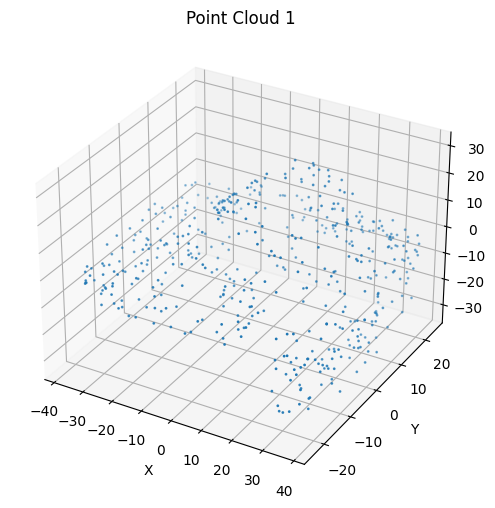

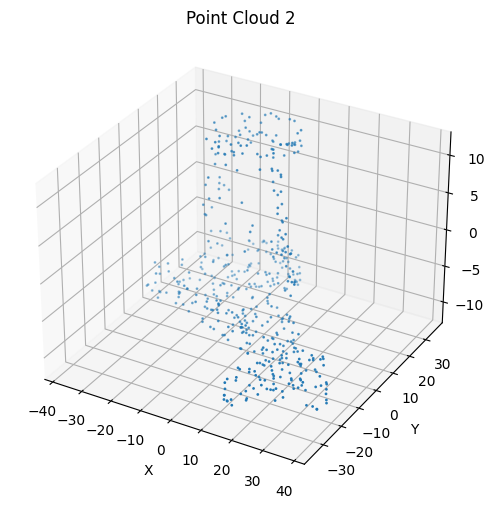

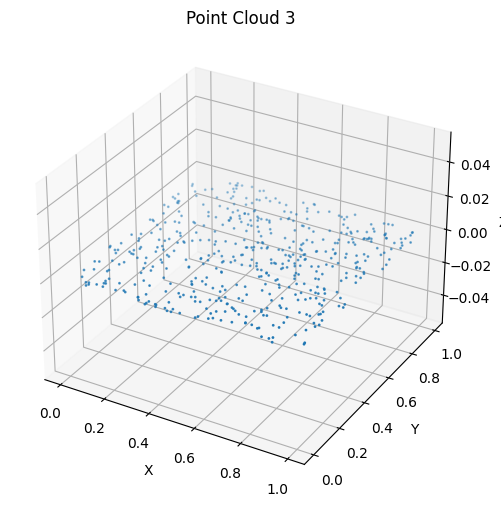

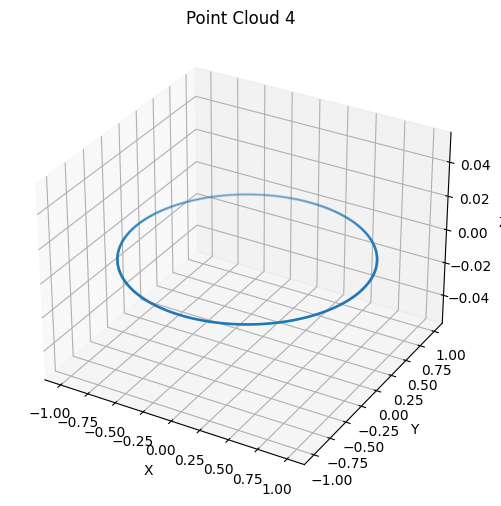

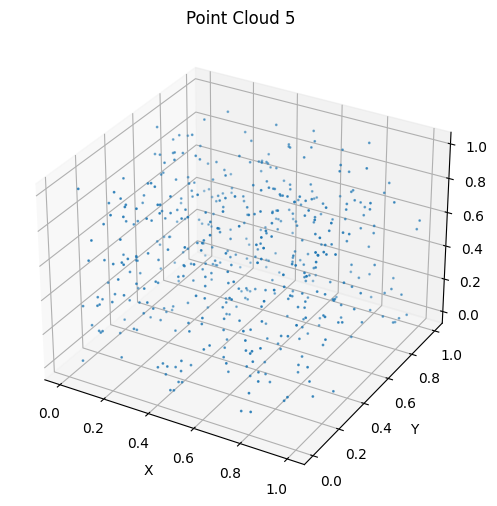

...

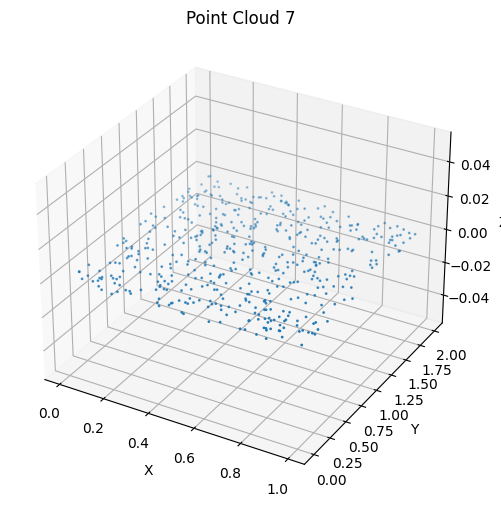

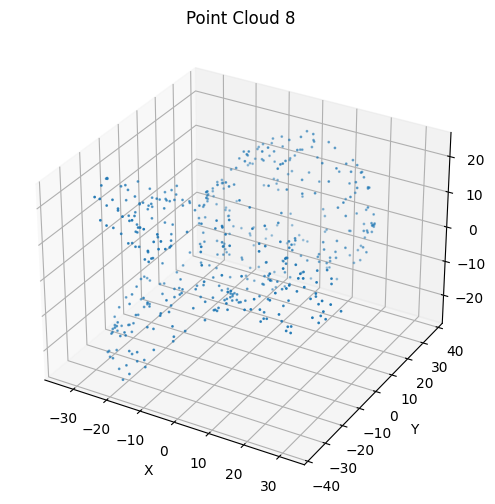

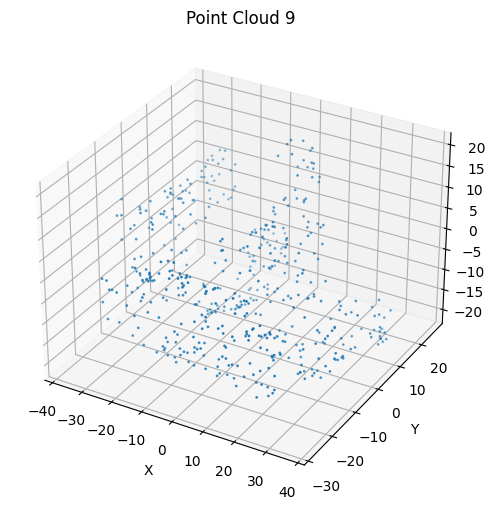

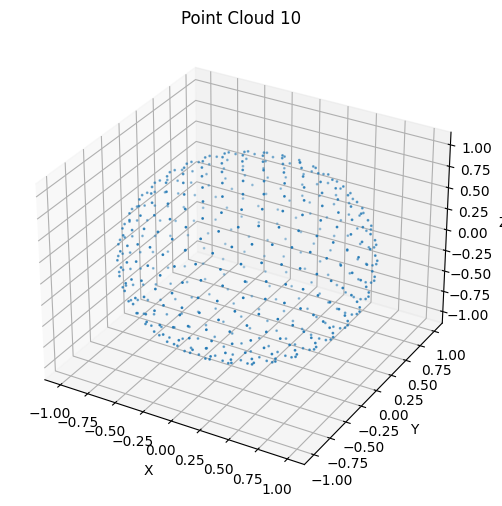

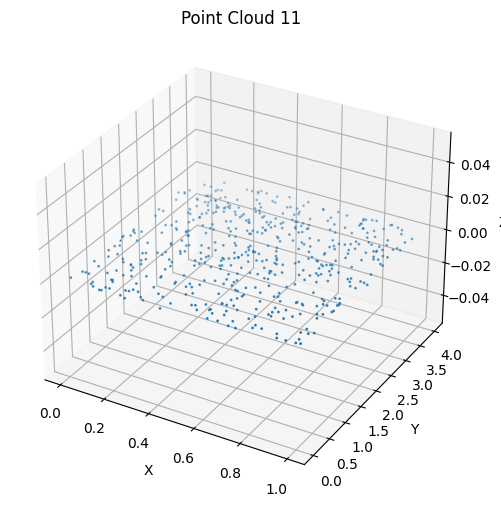

In [56]:
# Import necessary libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from plyfile import PlyData
import os
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from torch.optim import Adam
from sklearn.decomposition import PCA

# Function to load point cloud data from .ply files
def load_point_cloud_from_ply(file_path):
    ply_data = PlyData.read(file_path)
    points = np.column_stack((ply_data['vertex']['x'], ply_data['vertex']['y'], ply_data['vertex']['z']))
    return torch.tensor(points, dtype=torch.float)

# Function to resample point clouds to a uniform number of points
def resample_point_cloud(point_cloud, num_points):
    if len(point_cloud) == num_points:
        return point_cloud
    elif len(point_cloud) > num_points:
        indices = np.random.choice(len(point_cloud), size=num_points, replace=False)
        return point_cloud[indices]
    else:
        raise ValueError("Point cloud has fewer points than required for resampling.")


import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Function to plot a single point cloud
def plot_point_cloud(points, title="Point Cloud", ax=None):
    if ax is None:
        fig = plt.figure(figsize=(8, 6))
        ax = fig.add_subplot(111, projection='3d')
    ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=1)  # 's' is the size of each point
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    return ax
# Load and preprocess the point cloud data
point_clouds_directory = './simple-3d-objects'
point_cloud_files = [f for f in os.listdir(point_clouds_directory) if f.endswith('.ply')]
point_clouds = [load_point_cloud_from_ply(os.path.join(point_clouds_directory, f)) for f in point_cloud_files]

# Resample all point clouds to have the same number of points
min_points = min(pc.shape[0] for pc in point_clouds)
point_clouds = [resample_point_cloud(pc, min_points) for pc in point_clouds]

for i, point_cloud in enumerate(point_clouds):
    plot_point_cloud(point_cloud, title=f"Point Cloud {i + 1}")
    plt.show()


In [3]:
# PointNet Encoder
class PointNetEncoder(nn.Module):
    def __init__(self, output_size=128):
        super(PointNetEncoder, self).__init__()
        self.conv1 = nn.Conv1d(3, 64, 1)
        self.conv2 = nn.Conv1d(64, 128, 1)
        self.conv3 = nn.Conv1d(128, output_size, 1)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.conv3(x)
        x = torch.max(x, 2, keepdim=False)[0]
        return x

# PointNet Decoder
class PointNetDecoder(nn.Module):
    def __init__(self, num_points=2048, latent_size=128):
        super(PointNetDecoder, self).__init__()
        self.num_points = num_points
        self.fc1 = nn.Linear(latent_size, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, num_points * 3)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x.view(-1, self.num_points, 3)

# PointNet Autoencoder
class PointNetAutoencoder(nn.Module):
    def __init__(self, num_points=min_points, latent_size=128):
        super(PointNetAutoencoder, self).__init__()
        self.encoder = PointNetEncoder(output_size=latent_size)
        self.decoder = PointNetDecoder(num_points=num_points, latent_size=latent_size)

    def forward(self, x):
        x = x.transpose(1, 2)  # PointNet expects [batch, channels, points]
        latent = self.encoder(x)
        reconstructed = self.decoder(latent)
        return reconstructed, latent

# Training the PointNet Autoencoder
def train_autoencoder(point_clouds, epochs=100, lr=0.001):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    autoencoder = PointNetAutoencoder().to(device)
    criterion = nn.MSELoss()
    optimizer = Adam(autoencoder.parameters(), lr=lr)
    point_clouds = torch.stack(point_clouds).to(device)

    for epoch in range(epochs):
        total_loss = 0
        for point_cloud in point_clouds:
            point_cloud = point_cloud.unsqueeze(0)  # Add batch dimension
            reconstructed, _ = autoencoder(point_cloud)
            loss = criterion(reconstructed, point_cloud)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        print(f"Epoch {epoch+1}, Loss: {total_loss/len(point_clouds)}")

# Plotting function for point clouds
def plot_point_cloud(points):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(points[:, 0], points[:, 1], points[:, 2], s=1)
    plt.show()

Epoch 1, Loss: 128.28817285868254
Epoch 2, Loss: 122.9552214321765
Epoch 3, Loss: 117.23459249463949
Epoch 4, Loss: 109.55297632921825
Epoch 5, Loss: 105.5792364207181
Epoch 6, Loss: 106.60721517828378
Epoch 7, Loss: 104.23647025363012
Epoch 8, Loss: 103.27632497792894
Epoch 9, Loss: 103.10339704155922
Epoch 10, Loss: 102.57923536544496
Epoch 11, Loss: 102.44683324477889
Epoch 12, Loss: 102.02845714241266
Epoch 13, Loss: 101.71922166645527
Epoch 14, Loss: 101.239145423201
Epoch 15, Loss: 100.57533910938285
Epoch 16, Loss: 99.14868823913011
Epoch 17, Loss: 96.95613234286958
Epoch 18, Loss: 95.59797116165811
Epoch 19, Loss: 95.38049741631204
Epoch 20, Loss: 89.0448898496953


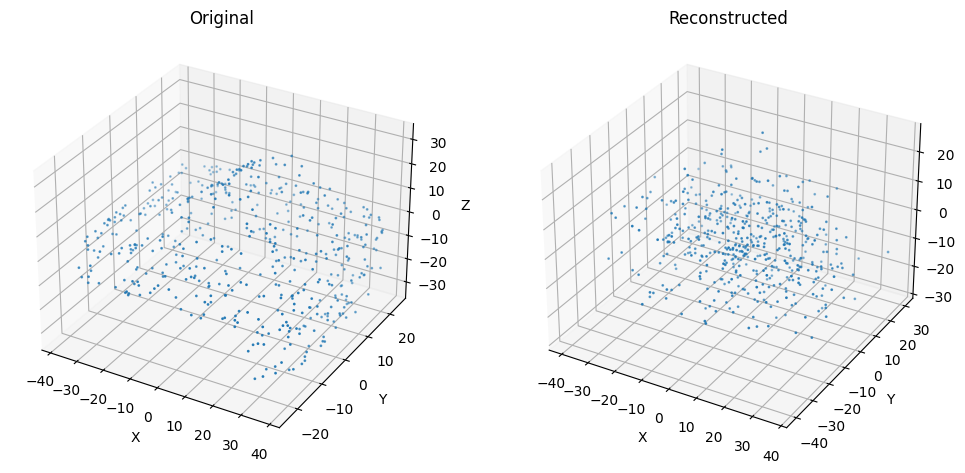

Epoch 21, Loss: 82.0559050752358
Epoch 22, Loss: 79.86175215108828
Epoch 23, Loss: 75.62105617469007
Epoch 24, Loss: 81.3849992670796
Epoch 25, Loss: 74.77246005968614
Epoch 26, Loss: 67.69810361415148
Epoch 27, Loss: 54.447204951535575
Epoch 28, Loss: 49.582132997160606
Epoch 29, Loss: 40.79086544838819
Epoch 30, Loss: 39.859439852562815
Epoch 31, Loss: 35.22207550772212
Epoch 32, Loss: 56.861557705835864
Epoch 33, Loss: 28.621654399416663
Epoch 34, Loss: 32.739498764276505
Epoch 35, Loss: 37.44099091535265
Epoch 36, Loss: 38.719964914023876
Epoch 37, Loss: 45.94382100620053
Epoch 38, Loss: 23.858737885951996
Epoch 39, Loss: 21.775252298875287
Epoch 40, Loss: 21.19073649969968


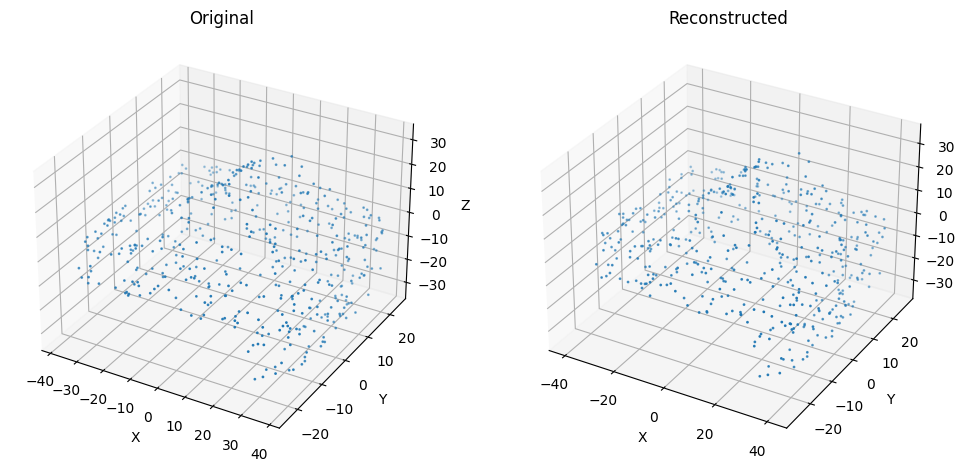

Epoch 41, Loss: 17.750526804138314
Epoch 42, Loss: 16.34955666756088
Epoch 43, Loss: 14.644489157606255
Epoch 44, Loss: 12.683114251629872
Epoch 45, Loss: 10.700722311708061
Epoch 46, Loss: 8.150712841613727
Epoch 47, Loss: 5.927722935649482
Epoch 48, Loss: 5.4374385909600695
Epoch 49, Loss: 7.775937300514091
Epoch 50, Loss: 8.13922011784532
Epoch 51, Loss: 10.425124431198293
Epoch 52, Loss: 6.97754655642943
Epoch 53, Loss: 4.561765656552532
Epoch 54, Loss: 5.6597198420627555
Epoch 55, Loss: 3.2511315420269966
Epoch 56, Loss: 15.106053304943172
Epoch 57, Loss: 16.489004115489397
Epoch 58, Loss: 8.560047327117486
Epoch 59, Loss: 8.304903152991425
Epoch 60, Loss: 2.9351072809235617


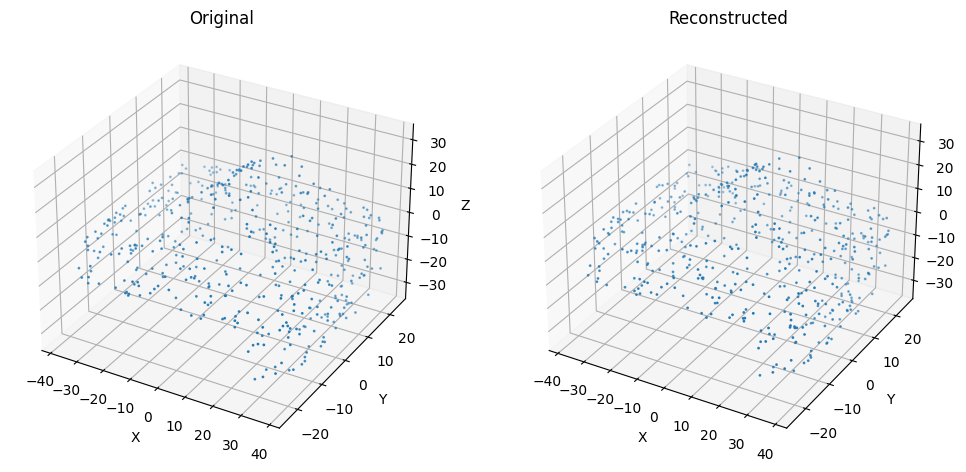

Epoch 61, Loss: 0.750378639521924
Epoch 62, Loss: 0.3225461441007527
Epoch 63, Loss: 0.21362703462893312
Epoch 64, Loss: 0.1282799845053391
Epoch 65, Loss: 0.09601861187680201
Epoch 66, Loss: 0.08656654856167734
Epoch 67, Loss: 0.08150369665500792
Epoch 68, Loss: 0.07718216471204703
Epoch 69, Loss: 0.07605840219184756
Epoch 70, Loss: 0.0774470293386416
Epoch 71, Loss: 0.08043812249194492
Epoch 72, Loss: 0.08399666710333391
Epoch 73, Loss: 0.09050963044335897
Epoch 74, Loss: 0.09940596923909405
Epoch 75, Loss: 0.11683164096691391
Epoch 76, Loss: 0.1379798801446503
Epoch 77, Loss: 0.1898096041245894
Epoch 78, Loss: 0.2519253343343735
Epoch 79, Loss: 0.3638297487050295
Epoch 80, Loss: 0.501515394076705


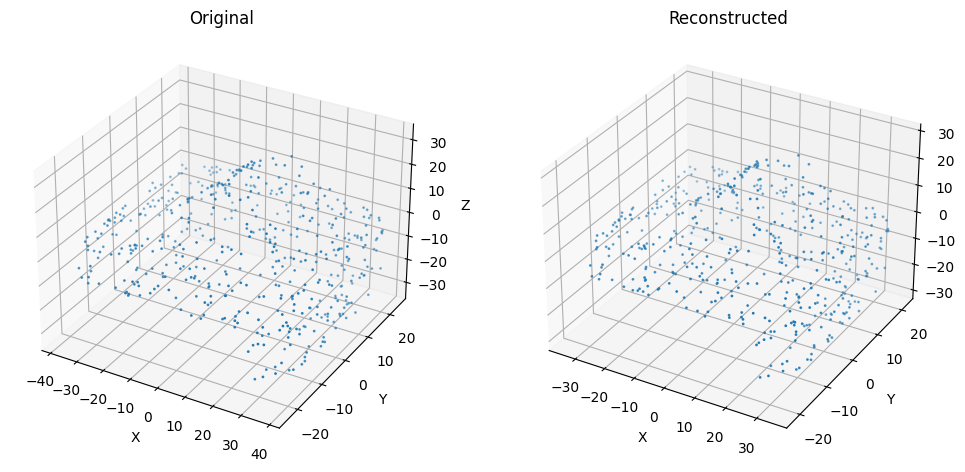

Epoch 81, Loss: 0.781377436847172
Epoch 82, Loss: 1.0363776707513765
Epoch 83, Loss: 1.5584641060029918
Epoch 84, Loss: 1.8279915273358875
Epoch 85, Loss: 2.377620915628292
Epoch 86, Loss: 2.4082608062943276
Epoch 87, Loss: 2.507138676094738
Epoch 88, Loss: 2.588527339764617
Epoch 89, Loss: 2.3120455018837345
Epoch 90, Loss: 2.439148322425105
Epoch 91, Loss: 1.8548808910629966
Epoch 92, Loss: 2.0539273045618427
Epoch 93, Loss: 1.8634046750481834
Epoch 94, Loss: 1.9900953890755773
Epoch 95, Loss: 1.7554681023413485
Epoch 96, Loss: 1.8231677013364704
Epoch 97, Loss: 1.5548616927963765
Epoch 98, Loss: 1.6902646153995937
Epoch 99, Loss: 1.4482803158462048
Epoch 100, Loss: 1.577568799680607


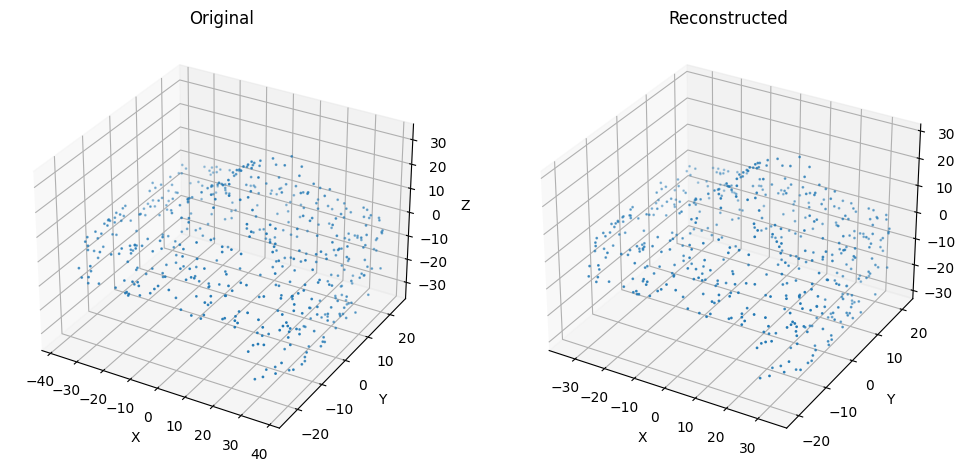

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from plyfile import PlyData
import os
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from torch.optim import Adam

# Function to visualize original and reconstructed point clouds
def visualize_reconstruction(original, reconstructed, title1="Original", title2="Reconstructed"):
    fig = plt.figure(figsize=(12, 6))

    ax1 = fig.add_subplot(121, projection='3d')
    ax1.scatter(original[:, 0], original[:, 1], original[:, 2], s=1)
    ax1.title.set_text(title1)
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')

    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(reconstructed[:, 0], reconstructed[:, 1], reconstructed[:, 2], s=1)
    ax2.title.set_text(title2)
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_zlabel('Z')

    plt.show()


# Modify the training function to include visualization
def train_and_visualize(point_clouds, epochs=100, lr=0.001, visualize_every_n_epochs=20):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    autoencoder = PointNetAutoencoder().to(device)
    criterion = nn.MSELoss()
    optimizer = Adam(autoencoder.parameters(), lr=lr)
    point_clouds = torch.stack(point_clouds).to(device)

    for epoch in range(epochs):
        total_loss = 0
        for point_cloud in point_clouds:
            point_cloud = point_cloud.unsqueeze(0)  # Add batch dimension
            reconstructed, _ = autoencoder(point_cloud)
            loss = criterion(reconstructed, point_cloud)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        print(f"Epoch {epoch+1}, Loss: {total_loss/len(point_clouds)}")

        # Visualize the reconstruction every n epochs
        if (epoch + 1) % visualize_every_n_epochs == 0:
            with torch.no_grad():
                original = point_clouds[0].squeeze().cpu().numpy()
                reconstructed = autoencoder(point_clouds[0].unsqueeze(0))[0].squeeze().cpu().numpy()
                visualize_reconstruction(original, reconstructed, "Original", "Reconstructed")

# Example usage
if __name__ == "__main__":
    train_and_visualize(point_clouds, epochs=100, lr=0.001, visualize_every_n_epochs=20)


Epoch 1, Avg Loss: 120.3400141398112
Epoch 2, Avg Loss: 124.82779947916667
Epoch 3, Avg Loss: 115.04690806070964
Epoch 4, Avg Loss: 106.21234639485677
Epoch 5, Avg Loss: 104.91576639811198
Epoch 6, Avg Loss: 105.13822174072266
Epoch 7, Avg Loss: 97.82347997029622
Epoch 8, Avg Loss: 101.65647761027019
Epoch 9, Avg Loss: 89.41282778978348
Epoch 10, Avg Loss: 95.20331319173177
Epoch 11, Avg Loss: 100.7899169921875
Epoch 12, Avg Loss: 94.85544077555339
Epoch 13, Avg Loss: 95.30214945475261
Epoch 14, Avg Loss: 105.36415990193684
Epoch 15, Avg Loss: 99.44872665405273
Epoch 16, Avg Loss: 98.43864822387695
Epoch 17, Avg Loss: 91.31335194905598
Epoch 18, Avg Loss: 90.77913411458333
Epoch 19, Avg Loss: 92.97608311971028
Epoch 20, Avg Loss: 95.4072597026825


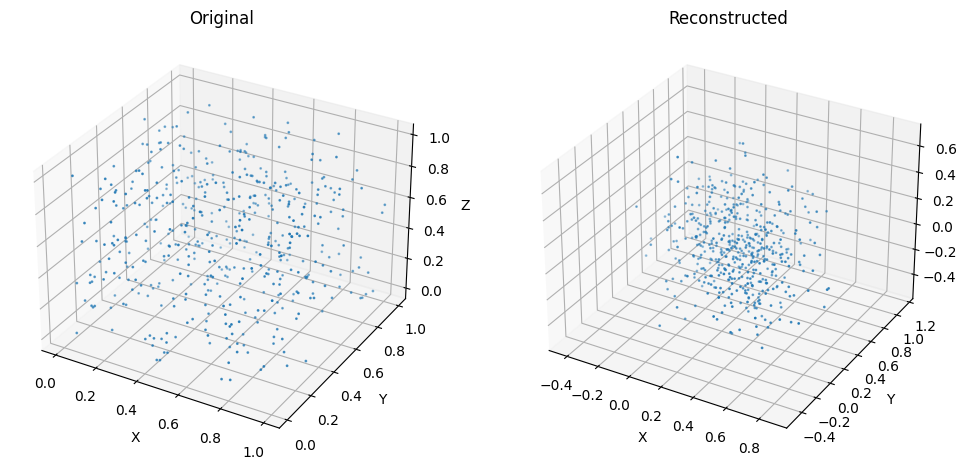

Epoch 21, Avg Loss: 79.69619496663411
Epoch 22, Avg Loss: 74.69336954752605
Epoch 23, Avg Loss: 66.90573732058208
Epoch 24, Avg Loss: 65.3422114054362
Epoch 25, Avg Loss: 66.19042841593425
Epoch 26, Avg Loss: 52.97581126292547
Epoch 27, Avg Loss: 57.758193949858345
Epoch 28, Avg Loss: 51.74273554484049
Epoch 29, Avg Loss: 47.478853384653725
Epoch 30, Avg Loss: 42.30527846018473
Epoch 31, Avg Loss: 40.47675005594889
Epoch 32, Avg Loss: 34.879859606424965
Epoch 33, Avg Loss: 34.76316833496094
Epoch 34, Avg Loss: 36.677433013916016
Epoch 35, Avg Loss: 27.26866388320923
Epoch 36, Avg Loss: 26.56955369313558
Epoch 37, Avg Loss: 29.550323168436687
Epoch 38, Avg Loss: 20.895848751068115
Epoch 39, Avg Loss: 19.22495996952057
Epoch 40, Avg Loss: 16.883893499771755


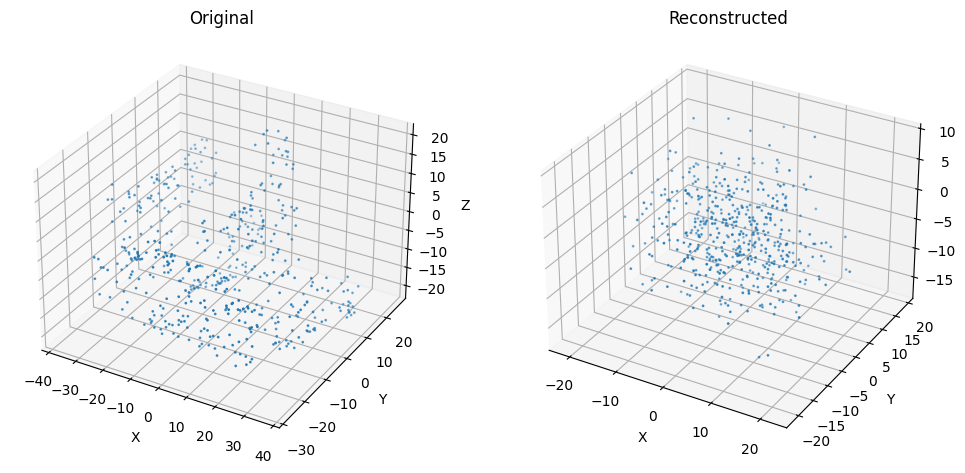

Epoch 41, Avg Loss: 15.193048099676767
Epoch 42, Avg Loss: 17.362098077932995
Epoch 43, Avg Loss: 12.75980051358541
Epoch 44, Avg Loss: 11.473814129829407
Epoch 45, Avg Loss: 8.97771010796229
Epoch 46, Avg Loss: 7.7623546322186785
Epoch 47, Avg Loss: 7.246130128701528
Epoch 48, Avg Loss: 4.898702303568522
Epoch 49, Avg Loss: 3.9170092344284058
Epoch 50, Avg Loss: 2.7977242469787598
Epoch 51, Avg Loss: 2.4278447230656943
Epoch 52, Avg Loss: 2.700314203898112
Epoch 53, Avg Loss: 3.7501672903696694
Epoch 54, Avg Loss: 8.8681587378184
Epoch 55, Avg Loss: 9.711941560109457
Epoch 56, Avg Loss: 10.126034577687582
Epoch 57, Avg Loss: 5.681450128555298
Epoch 58, Avg Loss: 14.992689291636148
Epoch 59, Avg Loss: 9.622182726860046
Epoch 60, Avg Loss: 15.931366125742594


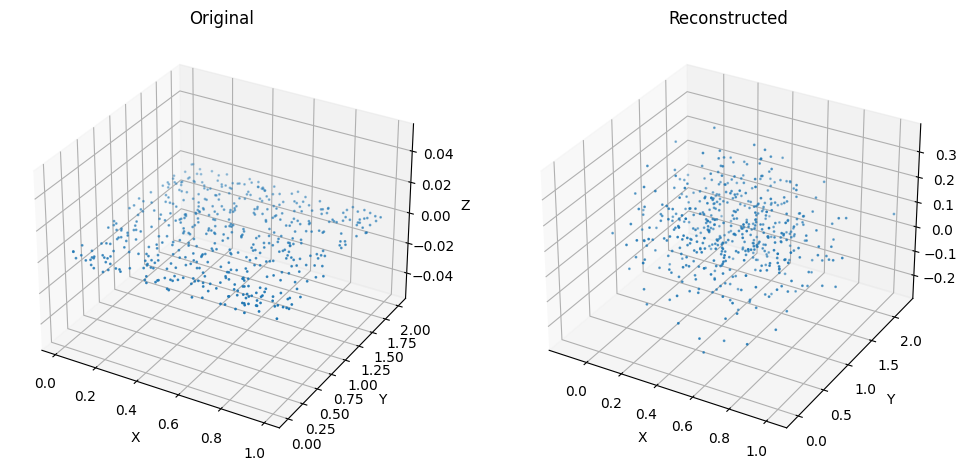

Epoch 61, Avg Loss: 5.8413205941518145
Epoch 62, Avg Loss: 10.204251329104105
Epoch 63, Avg Loss: 5.824977795283
Epoch 64, Avg Loss: 2.9496396581331887
Epoch 65, Avg Loss: 6.015146533648173
Epoch 66, Avg Loss: 2.340107003847758
Epoch 67, Avg Loss: 3.9536867340405784
Epoch 68, Avg Loss: 2.235918497045835
Epoch 69, Avg Loss: 1.7750660578409831
Epoch 70, Avg Loss: 1.728954553604126
Epoch 71, Avg Loss: 0.9556004703044891
Epoch 72, Avg Loss: 0.750811313589414
Epoch 73, Avg Loss: 0.5086402197678884
Epoch 74, Avg Loss: 0.6687365273634592
Epoch 75, Avg Loss: 0.30975498755772907
Epoch 76, Avg Loss: 0.2946861883004506
Epoch 77, Avg Loss: 0.3559953471024831
Epoch 78, Avg Loss: 0.23651627202828726
Epoch 79, Avg Loss: 0.26908311744530994
Epoch 80, Avg Loss: 0.21457610527674356


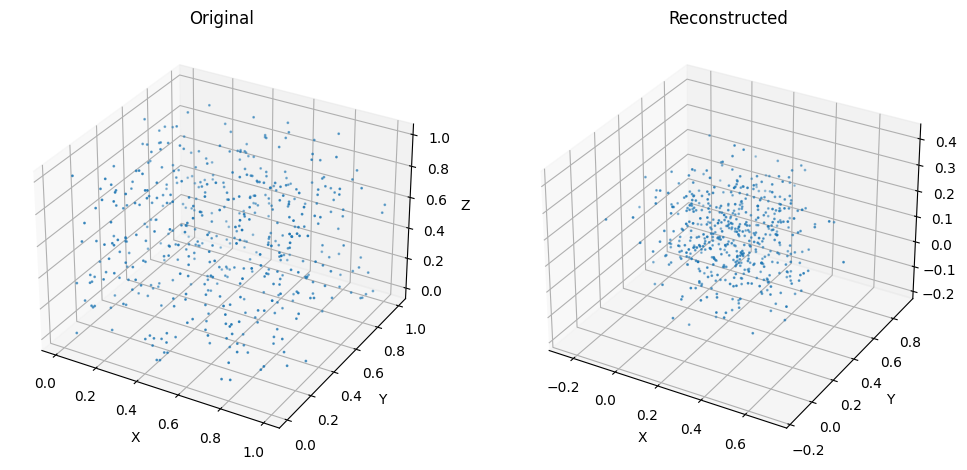

Epoch 81, Avg Loss: 0.15456322580575943
Epoch 82, Avg Loss: 0.2780853708585103
Epoch 83, Avg Loss: 0.1719682365655899
Epoch 84, Avg Loss: 0.12475244700908661
Epoch 85, Avg Loss: 0.16989772021770477
Epoch 86, Avg Loss: 0.12162795414527257
Epoch 87, Avg Loss: 0.11390533298254013
Epoch 88, Avg Loss: 0.11428576459487279
Epoch 89, Avg Loss: 0.09704196204741795
Epoch 90, Avg Loss: 0.10530363768339157
Epoch 91, Avg Loss: 0.10192273557186127
Epoch 92, Avg Loss: 0.10168654471635818
Epoch 93, Avg Loss: 0.09492957095305125
Epoch 94, Avg Loss: 0.10015230750044186
Epoch 95, Avg Loss: 0.09379080558816592
Epoch 96, Avg Loss: 0.09244994198282559
Epoch 97, Avg Loss: 0.08840247616171837
Epoch 98, Avg Loss: 0.08730565756559372
Epoch 99, Avg Loss: 0.09255850811799367
Epoch 100, Avg Loss: 0.08856915310025215


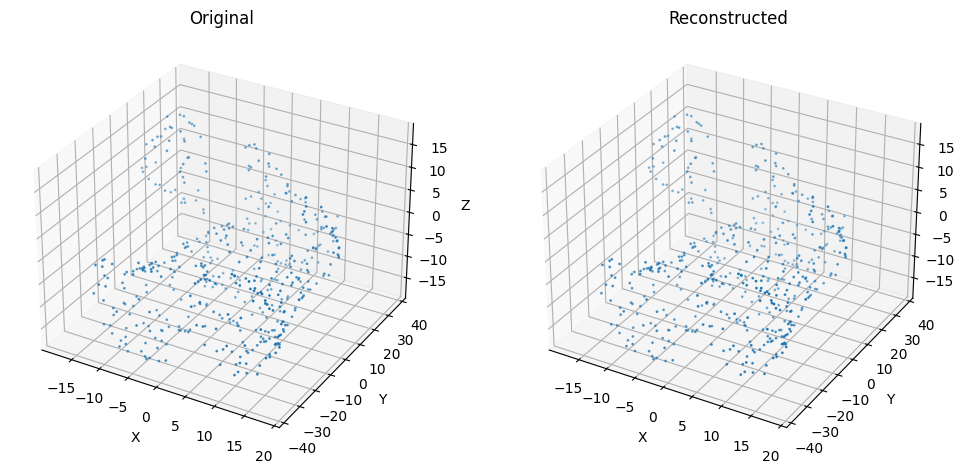

Epoch 101, Avg Loss: 0.08650529757142067
Epoch 102, Avg Loss: 0.08163211743036906
Epoch 103, Avg Loss: 0.08688285139699777
Epoch 104, Avg Loss: 0.07764978210131328
Epoch 105, Avg Loss: 0.07928566137949626
Epoch 106, Avg Loss: 0.07536535834272702
Epoch 107, Avg Loss: 0.07539696991443634
Epoch 108, Avg Loss: 0.08768825729688008
Epoch 109, Avg Loss: 0.07117833693822224
Epoch 110, Avg Loss: 0.07905666157603264
Epoch 111, Avg Loss: 0.07682207599282265
Epoch 112, Avg Loss: 0.07391944713890553
Epoch 113, Avg Loss: 0.07598622515797615
Epoch 114, Avg Loss: 0.06927443792422612
Epoch 115, Avg Loss: 0.0744851032892863
Epoch 116, Avg Loss: 0.07415309300025304
Epoch 117, Avg Loss: 0.06846639265616734
Epoch 118, Avg Loss: 0.06729106108347575
Epoch 119, Avg Loss: 0.07561743073165417
Epoch 120, Avg Loss: 0.06444081664085388


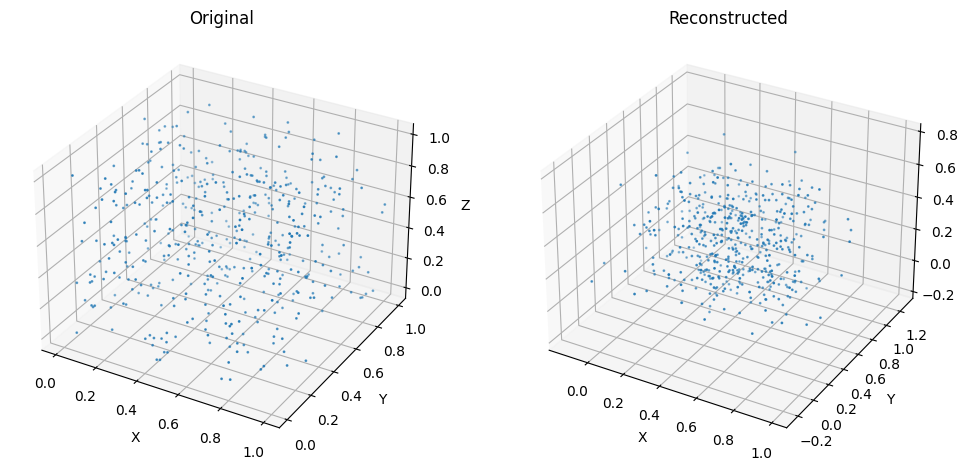

Epoch 121, Avg Loss: 0.06613301609953244
Epoch 122, Avg Loss: 0.06804079934954643
Epoch 123, Avg Loss: 0.0710201007896103
Epoch 124, Avg Loss: 0.060238588601350784
Epoch 125, Avg Loss: 0.06569249679644902
Epoch 126, Avg Loss: 0.05926980574925741
Epoch 127, Avg Loss: 0.06070532898108164
Epoch 128, Avg Loss: 0.059851242850224175
Epoch 129, Avg Loss: 0.059657604744036995
Epoch 130, Avg Loss: 0.06332884977261226
Epoch 131, Avg Loss: 0.05926002375781536
Epoch 132, Avg Loss: 0.059042539447546005
Epoch 133, Avg Loss: 0.05424133346726497
Epoch 134, Avg Loss: 0.053591917268931866
Epoch 135, Avg Loss: 0.052107562291591115
Epoch 136, Avg Loss: 0.05901330957810084
Epoch 137, Avg Loss: 0.05315778994311889
Epoch 138, Avg Loss: 0.06163314109047254
Epoch 139, Avg Loss: 0.05082781950477511
Epoch 140, Avg Loss: 0.0570119246840477


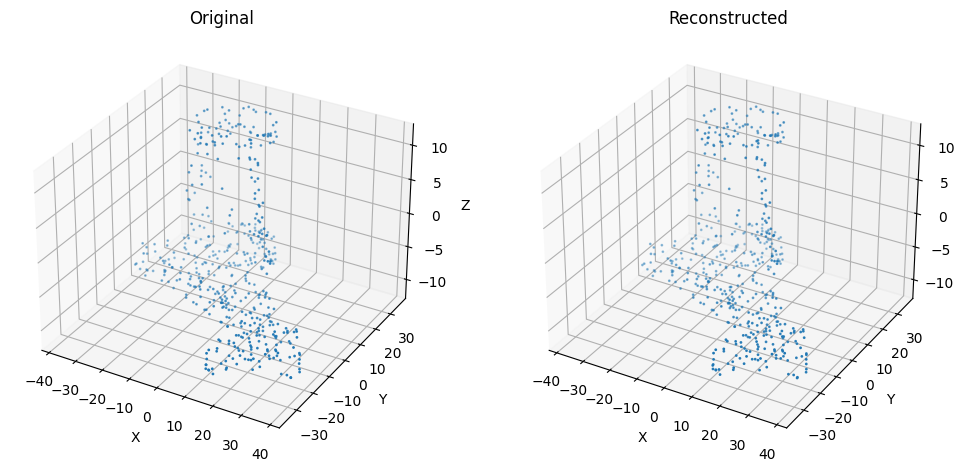

Epoch 141, Avg Loss: 0.06395573417345683
Epoch 142, Avg Loss: 0.056105572963133454
Epoch 143, Avg Loss: 0.09360853706796964
Epoch 144, Avg Loss: 0.06100371852517128
Epoch 145, Avg Loss: 0.07067314659555753
Epoch 146, Avg Loss: 0.08217265456914902
Epoch 147, Avg Loss: 0.09120450168848038
Epoch 148, Avg Loss: 0.06678999339540799
Epoch 149, Avg Loss: 0.07353390877445538
Epoch 150, Avg Loss: 0.06941263501842816
Epoch 151, Avg Loss: 0.06945298239588737
Epoch 152, Avg Loss: 0.06537577509880066
Epoch 153, Avg Loss: 0.058302956322828926
Epoch 154, Avg Loss: 0.05635225276152293
Epoch 155, Avg Loss: 0.054421241084734596
Epoch 156, Avg Loss: 0.0549261619647344
Epoch 157, Avg Loss: 0.04619488803048929
Epoch 158, Avg Loss: 0.06015777836243311
Epoch 159, Avg Loss: 0.056787059952815376
Epoch 160, Avg Loss: 0.05092231029023727


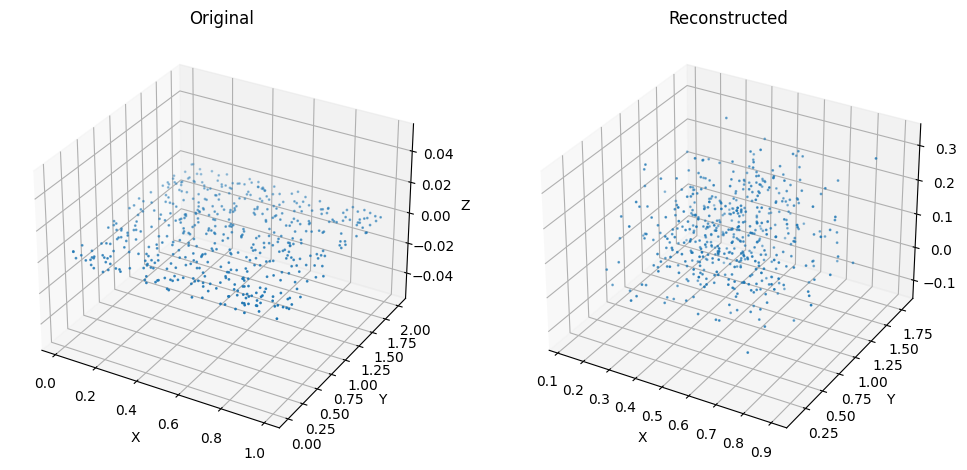

Epoch 161, Avg Loss: 0.046450906743605934
Epoch 162, Avg Loss: 0.052478041499853134
Epoch 163, Avg Loss: 0.04845867119729519
Epoch 164, Avg Loss: 0.05160691464940707
Epoch 165, Avg Loss: 0.045863102500637375
Epoch 166, Avg Loss: 0.04457734152674675
Epoch 167, Avg Loss: 0.042279056583841644
Epoch 168, Avg Loss: 0.06725163633624713
Epoch 169, Avg Loss: 0.04699513129889965
Epoch 170, Avg Loss: 0.058834791804353394
Epoch 171, Avg Loss: 0.05348104859391848
Epoch 172, Avg Loss: 0.047739761571089424
Epoch 173, Avg Loss: 0.07667786255478859
Epoch 174, Avg Loss: 0.06609717011451721
Epoch 175, Avg Loss: 0.11253045002619426
Epoch 176, Avg Loss: 0.07901649797956149
Epoch 177, Avg Loss: 0.1439596749842167
Epoch 178, Avg Loss: 0.05030840138594309
Epoch 179, Avg Loss: 0.07746849084893863
Epoch 180, Avg Loss: 0.044614194581906


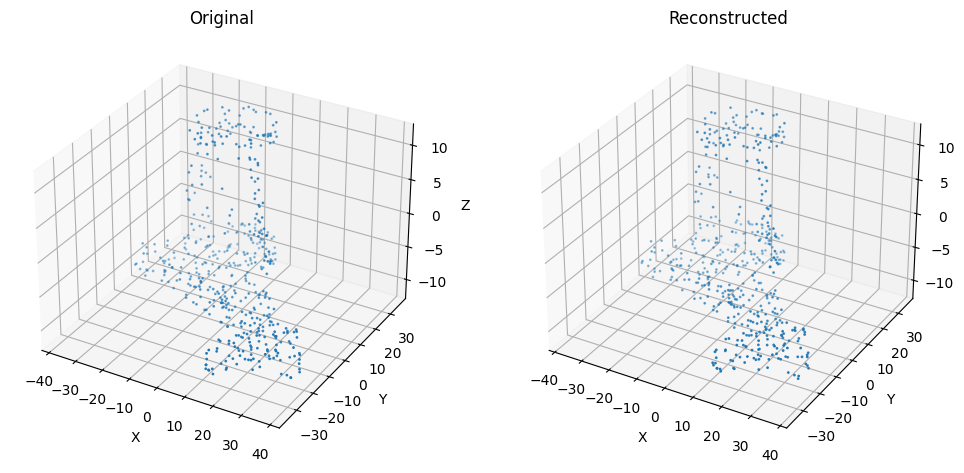

Epoch 181, Avg Loss: 0.10388877615332603
Epoch 182, Avg Loss: 0.05641317988435427
Epoch 183, Avg Loss: 0.19487895568211874
Epoch 184, Avg Loss: 0.06457096834977467
Epoch 185, Avg Loss: 0.5066353181997935
Epoch 186, Avg Loss: 0.16449319571256638
Epoch 187, Avg Loss: 1.2478958268960316
Epoch 188, Avg Loss: 0.9258564362923304
Epoch 189, Avg Loss: 1.2696543882290523
Epoch 190, Avg Loss: 1.9389549009501934
Epoch 191, Avg Loss: 1.082646131515503
Epoch 192, Avg Loss: 0.7434931968649229
Epoch 193, Avg Loss: 1.971178452173869
Epoch 194, Avg Loss: 0.7525240778923035
Epoch 195, Avg Loss: 0.8003100554148356
Epoch 196, Avg Loss: 1.01216222345829
Epoch 197, Avg Loss: 0.30423537393411
Epoch 198, Avg Loss: 0.43958404287695885
Epoch 199, Avg Loss: 0.5590206856528918
Epoch 200, Avg Loss: 0.40420664474368095


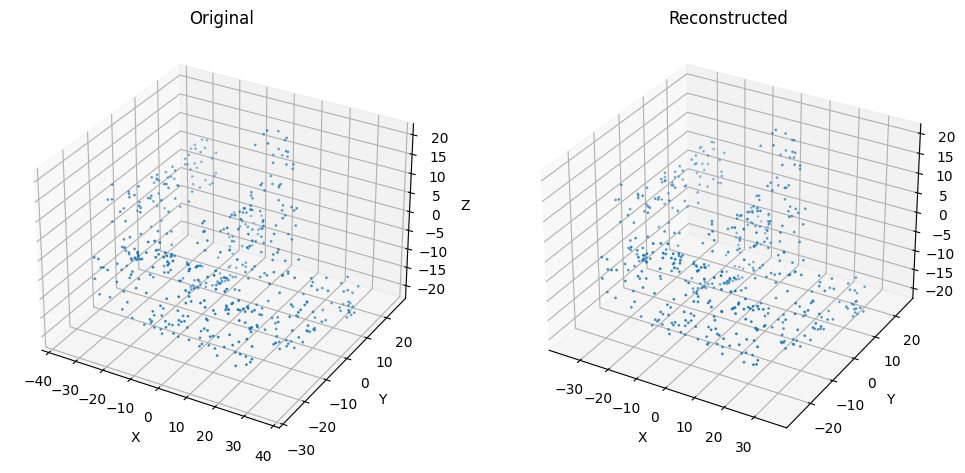

Epoch 201, Avg Loss: 0.23696608344713846
Epoch 202, Avg Loss: 0.2955702828864257
Epoch 203, Avg Loss: 0.1368837095797062
Epoch 204, Avg Loss: 0.3770113041003545
Epoch 205, Avg Loss: 0.246830636014541
Epoch 206, Avg Loss: 0.19793076192339262
Epoch 207, Avg Loss: 0.15835999076565108
Epoch 208, Avg Loss: 0.21646757672230402
Epoch 209, Avg Loss: 0.18567106872797012
Epoch 210, Avg Loss: 0.11658208196361859
Epoch 211, Avg Loss: 0.10566635057330132
Epoch 212, Avg Loss: 0.25204695016145706
Epoch 213, Avg Loss: 0.1256100907921791
Epoch 214, Avg Loss: 0.4446707218885422
Epoch 215, Avg Loss: 0.24704575290282568
Epoch 216, Avg Loss: 0.13699798534313837
Epoch 217, Avg Loss: 0.18473997960488
Epoch 218, Avg Loss: 0.16918539131681123
Epoch 219, Avg Loss: 0.11634786364932855
Epoch 220, Avg Loss: 0.10662523905436198


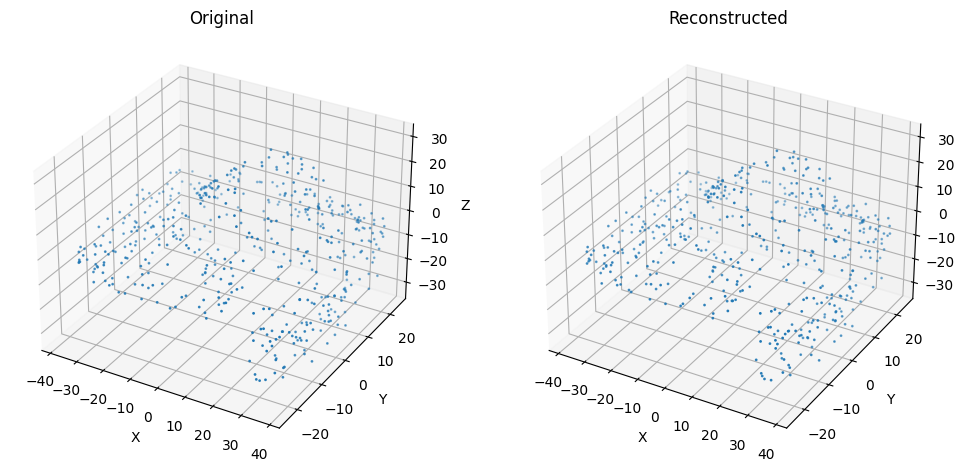

Epoch 221, Avg Loss: 0.07562580828865369
Epoch 222, Avg Loss: 0.07107029668986797
Epoch 223, Avg Loss: 0.05916359399755796
Epoch 224, Avg Loss: 0.055384653309981026
Epoch 225, Avg Loss: 0.04518185928463936
Epoch 226, Avg Loss: 0.05366182203094164
Epoch 227, Avg Loss: 0.03313974353174368
Epoch 228, Avg Loss: 0.03311855966846148
Epoch 229, Avg Loss: 0.025186132018764813
Epoch 230, Avg Loss: 0.028861770406365395
Epoch 231, Avg Loss: 0.021379594535877306
Epoch 232, Avg Loss: 0.02324874388674895
Epoch 233, Avg Loss: 0.020371655002236366
Epoch 234, Avg Loss: 0.018031535980602104
Epoch 235, Avg Loss: 0.017857502680271864
Epoch 236, Avg Loss: 0.019585031395157177
Epoch 237, Avg Loss: 0.01785055346166094
Epoch 238, Avg Loss: 0.01706161784629027
Epoch 239, Avg Loss: 0.016401992334673803
Epoch 240, Avg Loss: 0.016509549769883353


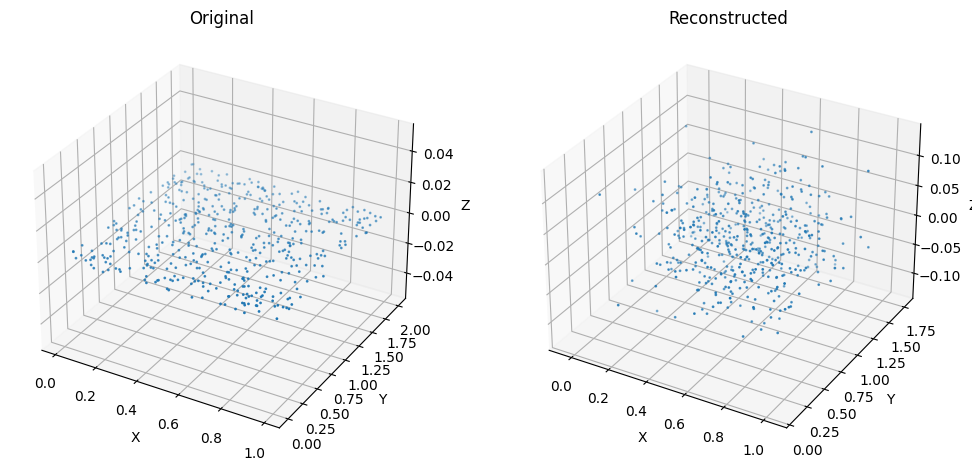

Epoch 241, Avg Loss: 0.015027663049598535
Epoch 242, Avg Loss: 0.01563295815140009
Epoch 243, Avg Loss: 0.013222740186999241
Epoch 244, Avg Loss: 0.012602248782059178
Epoch 245, Avg Loss: 0.013453842140734196
Epoch 246, Avg Loss: 0.012280713766813278
Epoch 247, Avg Loss: 0.014279017612958947
Epoch 248, Avg Loss: 0.011893882183358073
Epoch 249, Avg Loss: 0.012245625567932924
Epoch 250, Avg Loss: 0.012180674510697523
Epoch 251, Avg Loss: 0.011023027899985513
Epoch 252, Avg Loss: 0.010792286930760989
Epoch 253, Avg Loss: 0.011230150237679482
Epoch 254, Avg Loss: 0.011347602431972822
Epoch 255, Avg Loss: 0.010039096232503653
Epoch 256, Avg Loss: 0.011433088531096777
Epoch 257, Avg Loss: 0.009592654979011664
Epoch 258, Avg Loss: 0.010256031528115273
Epoch 259, Avg Loss: 0.009160915894123415
Epoch 260, Avg Loss: 0.008946134417783469


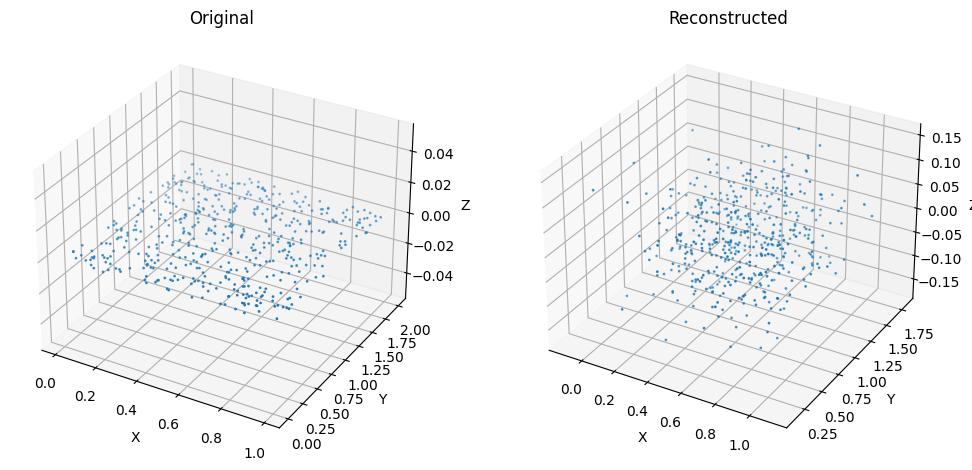

Epoch 261, Avg Loss: 0.008702384948264807
Epoch 262, Avg Loss: 0.009880092615882555
Epoch 263, Avg Loss: 0.010219302765714625
Epoch 264, Avg Loss: 0.009731304472855603
Epoch 265, Avg Loss: 0.007925809506559744
Epoch 266, Avg Loss: 0.008559016976505518
Epoch 267, Avg Loss: 0.008752086529663453
Epoch 268, Avg Loss: 0.009008513453106085
Epoch 269, Avg Loss: 0.008023326246378323
Epoch 270, Avg Loss: 0.008113766632353267
Epoch 271, Avg Loss: 0.007957350501480201
Epoch 272, Avg Loss: 0.006625465854691963
Epoch 273, Avg Loss: 0.007546321799357732
Epoch 274, Avg Loss: 0.006227908151534696
Epoch 275, Avg Loss: 0.006195208212981622
Epoch 276, Avg Loss: 0.0068925932670633
Epoch 277, Avg Loss: 0.005907448047461609
Epoch 278, Avg Loss: 0.005661702831275761
Epoch 279, Avg Loss: 0.0065555148757994175
Epoch 280, Avg Loss: 0.005132375770093252


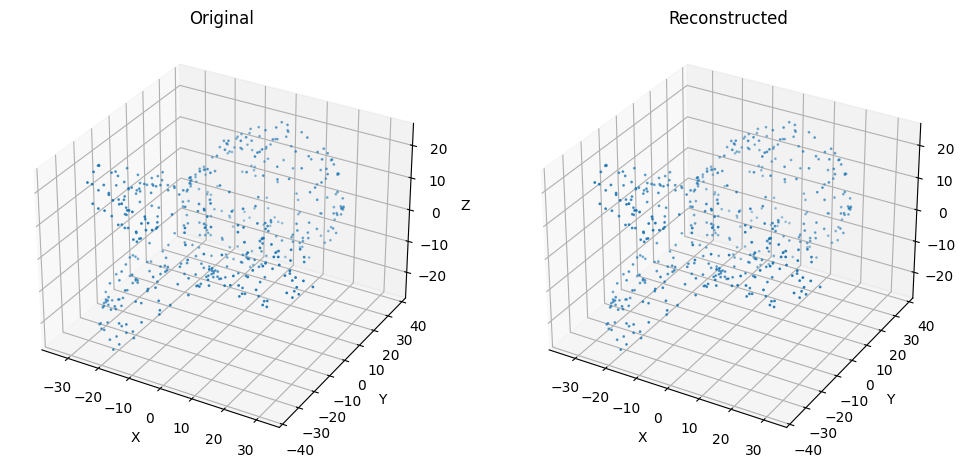

Epoch 281, Avg Loss: 0.005039567089018722
Epoch 282, Avg Loss: 0.0050620151062806444
Epoch 283, Avg Loss: 0.004704963939730078
Epoch 284, Avg Loss: 0.00442456560752665
Epoch 285, Avg Loss: 0.004975917128225167
Epoch 286, Avg Loss: 0.004217864770907909
Epoch 287, Avg Loss: 0.004642506634506087
Epoch 288, Avg Loss: 0.004633030854165554
Epoch 289, Avg Loss: 0.004752647558537622
Epoch 290, Avg Loss: 0.003751893217364947
Epoch 291, Avg Loss: 0.0037255018445042274
Epoch 292, Avg Loss: 0.004342182461793224
Epoch 293, Avg Loss: 0.003971630105903993
Epoch 294, Avg Loss: 0.003410989767871797
Epoch 295, Avg Loss: 0.003791542684969803
Epoch 296, Avg Loss: 0.003238679860563328
Epoch 297, Avg Loss: 0.0042980020710577565
Epoch 298, Avg Loss: 0.003149214511116346
Epoch 299, Avg Loss: 0.0028293648113807044
Epoch 300, Avg Loss: 0.0031132299918681383


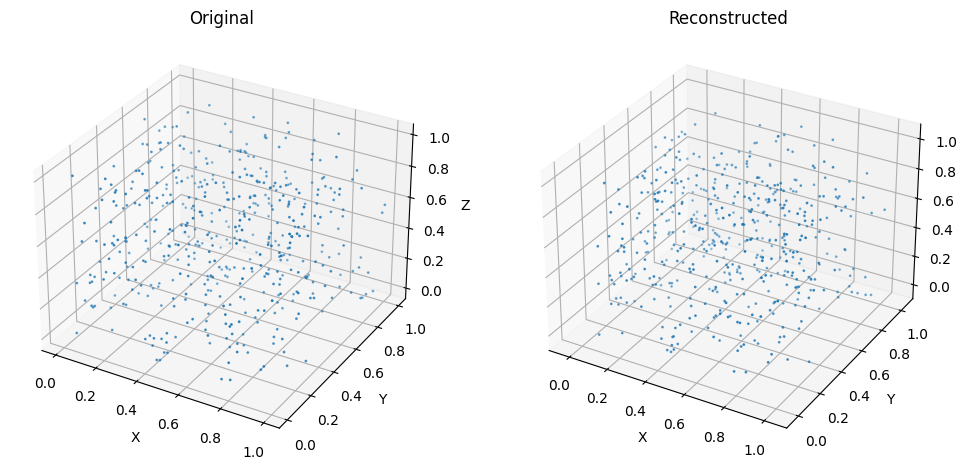

Epoch 301, Avg Loss: 0.0026003087793166437
Epoch 302, Avg Loss: 0.00227606533250461
Epoch 303, Avg Loss: 0.00227371696382761
Epoch 304, Avg Loss: 0.0023220300984879336
Epoch 305, Avg Loss: 0.001742494311959793
Epoch 306, Avg Loss: 0.0018443686033909519
Epoch 307, Avg Loss: 0.0017439249980573852
Epoch 308, Avg Loss: 0.001684414940730979
Epoch 309, Avg Loss: 0.0014121089867937069
Epoch 310, Avg Loss: 0.0013473551953211427
Epoch 311, Avg Loss: 0.0016817314123424392
Epoch 312, Avg Loss: 0.0016519943601451814
Epoch 313, Avg Loss: 0.0034250560177800557
Epoch 314, Avg Loss: 0.003527486192372938
Epoch 315, Avg Loss: 0.011684615708266696
Epoch 316, Avg Loss: 0.005902558778567861
Epoch 317, Avg Loss: 0.03784625930711627
Epoch 318, Avg Loss: 0.009633191550771395
Epoch 319, Avg Loss: 0.1435853597552826
Epoch 320, Avg Loss: 0.0654149188970526


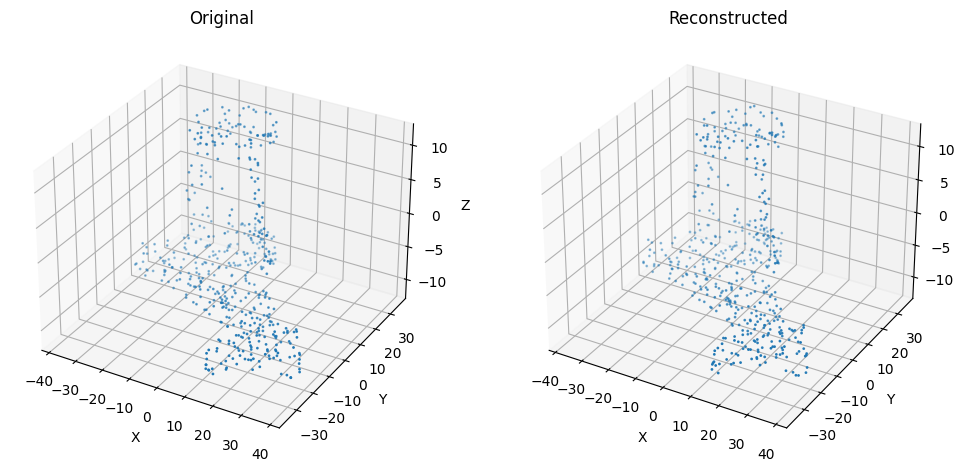

Epoch 321, Avg Loss: 0.18198242938766876
Epoch 322, Avg Loss: 0.10259411359826724
Epoch 323, Avg Loss: 0.19893795779595772
Epoch 324, Avg Loss: 0.10083840833976865
Epoch 325, Avg Loss: 0.03495284480353197
Epoch 326, Avg Loss: 0.16452269752820334
Epoch 327, Avg Loss: 0.08114843272293608
Epoch 328, Avg Loss: 0.08383522120614846
Epoch 329, Avg Loss: 0.034998798122008644
Epoch 330, Avg Loss: 0.09743278830622633
Epoch 331, Avg Loss: 0.04830317346689602
Epoch 332, Avg Loss: 0.013731561290721098
Epoch 333, Avg Loss: 0.034523929158846535
Epoch 334, Avg Loss: 0.01228601592204844
Epoch 335, Avg Loss: 0.008911258541047573
Epoch 336, Avg Loss: 0.01507108014387389
Epoch 337, Avg Loss: 0.024328646482899785
Epoch 338, Avg Loss: 0.0078782777612408
Epoch 339, Avg Loss: 0.011161795739705363
Epoch 340, Avg Loss: 0.006370653863996267


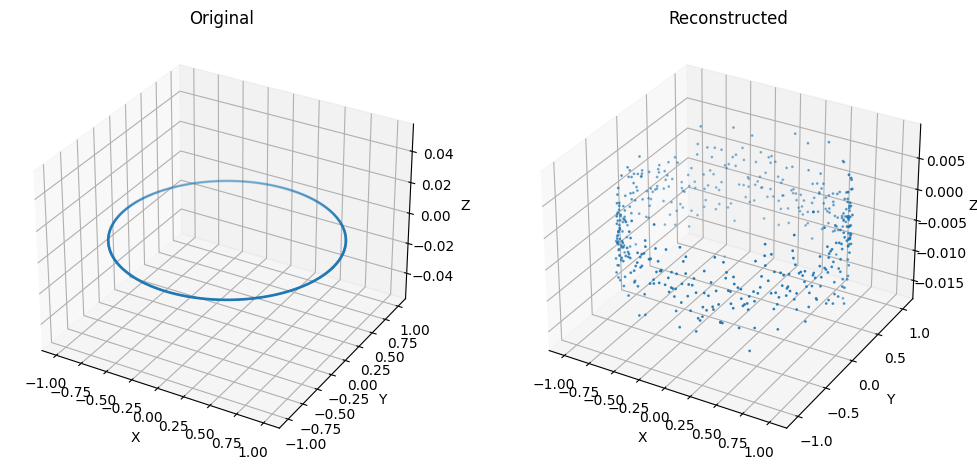

Epoch 341, Avg Loss: 0.003682901617139578
Epoch 342, Avg Loss: 0.006026005915676554
Epoch 343, Avg Loss: 0.004080954706296325
Epoch 344, Avg Loss: 0.003993135935161263
Epoch 345, Avg Loss: 0.0037979306847167513
Epoch 346, Avg Loss: 0.0015954063662017386
Epoch 347, Avg Loss: 0.0020835124499474964
Epoch 348, Avg Loss: 0.0019218881692116458
Epoch 349, Avg Loss: 0.0018510106407726805
Epoch 350, Avg Loss: 0.0016025306346515815
Epoch 351, Avg Loss: 0.0024059046021041772
Epoch 352, Avg Loss: 0.0030518102381999293
Epoch 353, Avg Loss: 0.0019930645260804645
Epoch 354, Avg Loss: 0.0023250000667758286
Epoch 355, Avg Loss: 0.0014172925342184801
Epoch 356, Avg Loss: 0.002785838136333041
Epoch 357, Avg Loss: 0.0021091204544063658
Epoch 358, Avg Loss: 0.0006782049507213136
Epoch 359, Avg Loss: 0.0005957940981412927
Epoch 360, Avg Loss: 0.0005314629427933445


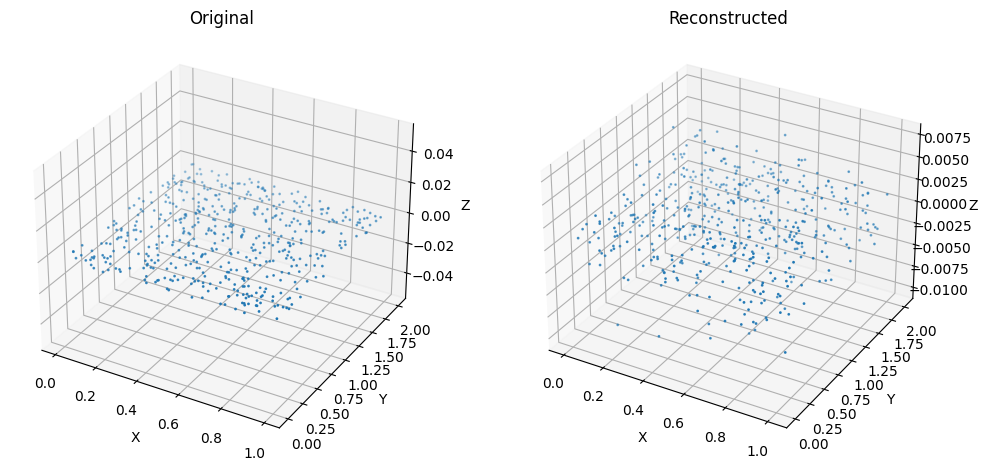

Epoch 361, Avg Loss: 0.0006128639894692848
Epoch 362, Avg Loss: 0.00037847428272167843
Epoch 363, Avg Loss: 0.0007100397197064012
Epoch 364, Avg Loss: 0.0003791090493905358
Epoch 365, Avg Loss: 0.00020112540611686805
Epoch 366, Avg Loss: 0.0002892239475234722
Epoch 367, Avg Loss: 0.00018330182744345316
Epoch 368, Avg Loss: 0.00022237780649447814
Epoch 369, Avg Loss: 0.0001439829453981171
Epoch 370, Avg Loss: 0.0001919209438104493
Epoch 371, Avg Loss: 0.00018617338112865886
Epoch 372, Avg Loss: 0.00016961944250700375
Epoch 373, Avg Loss: 0.0006544271624685886
Epoch 374, Avg Loss: 0.00037644630841289956
Epoch 375, Avg Loss: 0.00043194797278071445
Epoch 376, Avg Loss: 0.00017914018098963425
Epoch 377, Avg Loss: 0.000844900838274043
Epoch 378, Avg Loss: 0.00038149959679382545
Epoch 379, Avg Loss: 0.0010068464204474974
Epoch 380, Avg Loss: 0.0007818782032700256


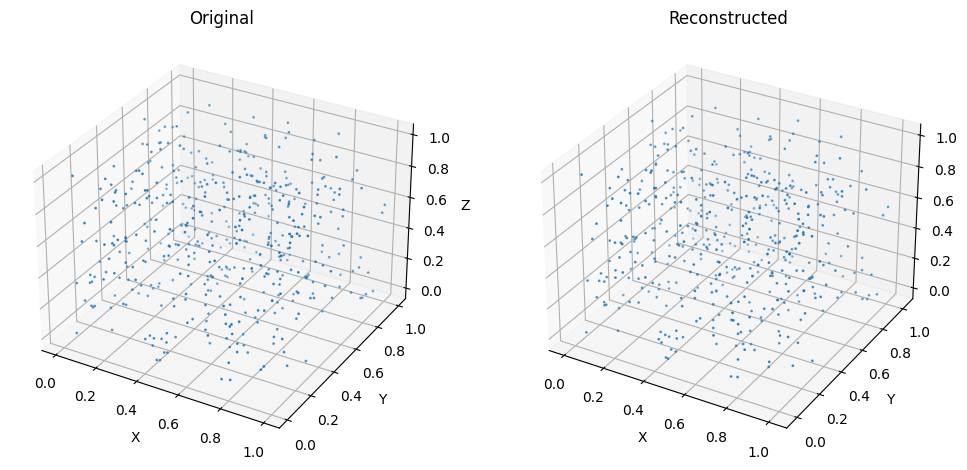

Epoch 381, Avg Loss: 0.004880876125146945
Epoch 382, Avg Loss: 0.0035280111672667167
Epoch 383, Avg Loss: 0.004374152912835901
Epoch 384, Avg Loss: 0.003265918465331197
Epoch 385, Avg Loss: 0.001320869773432302
Epoch 386, Avg Loss: 0.0018154823895505008
Epoch 387, Avg Loss: 0.001532842352996037
Epoch 388, Avg Loss: 0.0019893593962478917
Epoch 389, Avg Loss: 0.00228508107829839
Epoch 390, Avg Loss: 0.0013309149071574211
Epoch 391, Avg Loss: 0.0061999214328049375
Epoch 392, Avg Loss: 0.0012986396711009245
Epoch 393, Avg Loss: 0.0019027279534687598
Epoch 394, Avg Loss: 0.0003368485680160423
Epoch 395, Avg Loss: 0.005673030740581453
Epoch 396, Avg Loss: 0.0010574857684938859
Epoch 397, Avg Loss: 0.011342575366143137
Epoch 398, Avg Loss: 0.005156508763320744
Epoch 399, Avg Loss: 0.022697831387631595
Epoch 400, Avg Loss: 0.02736182347871363


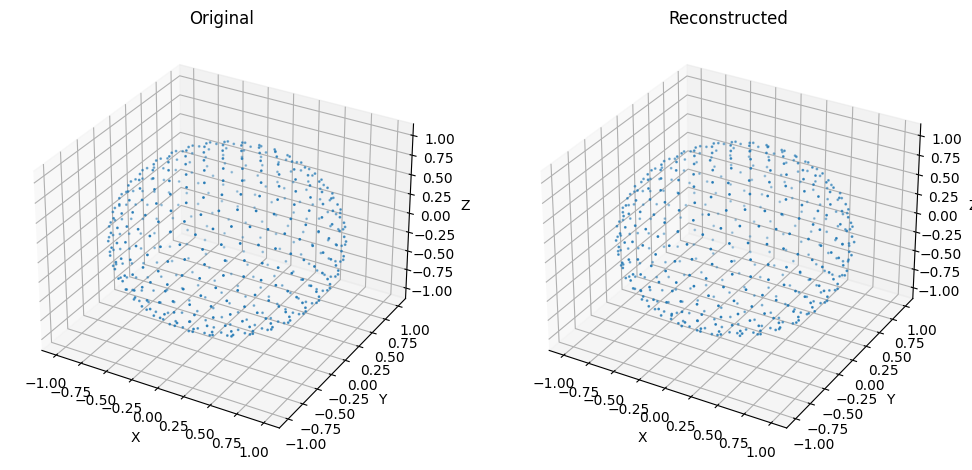

Epoch 401, Avg Loss: 0.0070889237492034836
Epoch 402, Avg Loss: 0.05384742212481797
Epoch 403, Avg Loss: 0.05606417606274287
Epoch 404, Avg Loss: 0.021781060534218948
Epoch 405, Avg Loss: 0.006350333336740732
Epoch 406, Avg Loss: 0.03351302305236459
Epoch 407, Avg Loss: 0.011535963664452234
Epoch 408, Avg Loss: 0.05967609335978826
Epoch 409, Avg Loss: 0.05375842750072479
Epoch 410, Avg Loss: 0.07107962412555935
Epoch 411, Avg Loss: 0.09144102782011032
Epoch 412, Avg Loss: 0.026692296082425553
Epoch 413, Avg Loss: 0.10854179955398043
Epoch 414, Avg Loss: 0.04985829504827658
Epoch 415, Avg Loss: 0.2573931875328223
Epoch 416, Avg Loss: 0.12063629552721977
Epoch 417, Avg Loss: 0.2004763800650835
Epoch 418, Avg Loss: 0.09946010385950406
Epoch 419, Avg Loss: 0.07578964779774348
Epoch 420, Avg Loss: 0.2536380582799514


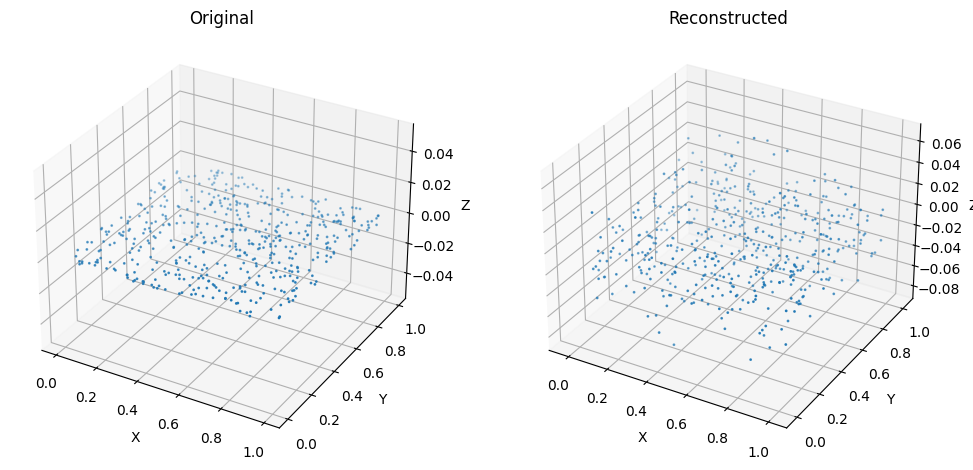

Epoch 421, Avg Loss: 0.18821908285220465
Epoch 422, Avg Loss: 0.12516610138118267
Epoch 423, Avg Loss: 0.11913156944016616
Epoch 424, Avg Loss: 0.30735660856589675
Epoch 425, Avg Loss: 0.4197811683019002
Epoch 426, Avg Loss: 0.47270815695325535
Epoch 427, Avg Loss: 1.258421510225162
Epoch 428, Avg Loss: 1.1821653929073364
Epoch 429, Avg Loss: 1.6312510669231415
Epoch 430, Avg Loss: 0.7802635530630747
Epoch 431, Avg Loss: 1.8971648067235947
Epoch 432, Avg Loss: 2.5361076281405985
Epoch 433, Avg Loss: 0.8938662707805634
Epoch 434, Avg Loss: 2.3964705169200897
Epoch 435, Avg Loss: 1.2870082159837086
Epoch 436, Avg Loss: 1.685959368944168
Epoch 437, Avg Loss: 1.2515093088150024
Epoch 438, Avg Loss: 2.051729361216227
Epoch 439, Avg Loss: 3.4455297390619912
Epoch 440, Avg Loss: 1.6435724000136058


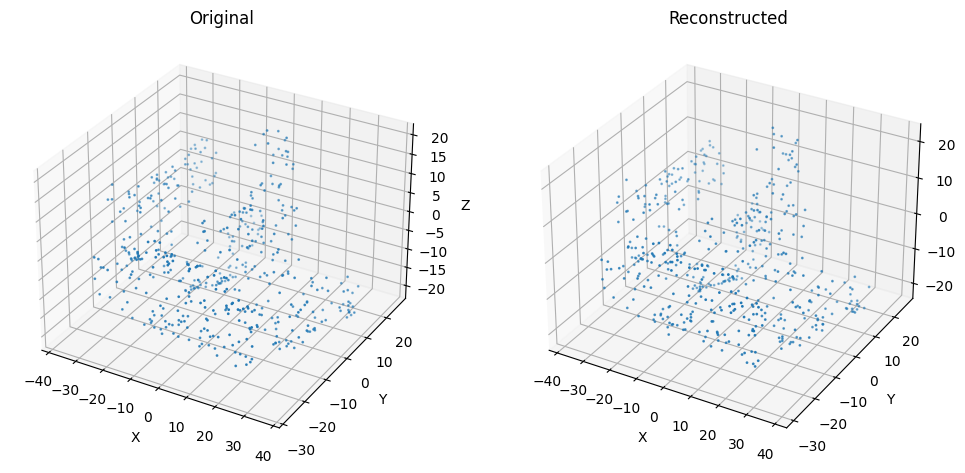

Epoch 441, Avg Loss: 1.7690884868303935
Epoch 442, Avg Loss: 2.9212260842323303
Epoch 443, Avg Loss: 1.841865638891856
Epoch 444, Avg Loss: 1.5127443472544353
Epoch 445, Avg Loss: 2.2655912407984338
Epoch 446, Avg Loss: 1.4003106753031414
Epoch 447, Avg Loss: 3.8248329857985177
Epoch 448, Avg Loss: 1.0647206930443645
Epoch 449, Avg Loss: 1.826821615298589
Epoch 450, Avg Loss: 1.4126134514808655
Epoch 451, Avg Loss: 0.5837393154700597
Epoch 452, Avg Loss: 0.5510444740454356
Epoch 453, Avg Loss: 0.5311312920724353
Epoch 454, Avg Loss: 0.5787918145457903
Epoch 455, Avg Loss: 0.3257341186205546
Epoch 456, Avg Loss: 0.3502747416496277
Epoch 457, Avg Loss: 0.39007314775759977
Epoch 458, Avg Loss: 0.515331387364616
Epoch 459, Avg Loss: 0.30607133607069653
Epoch 460, Avg Loss: 0.606010302901268


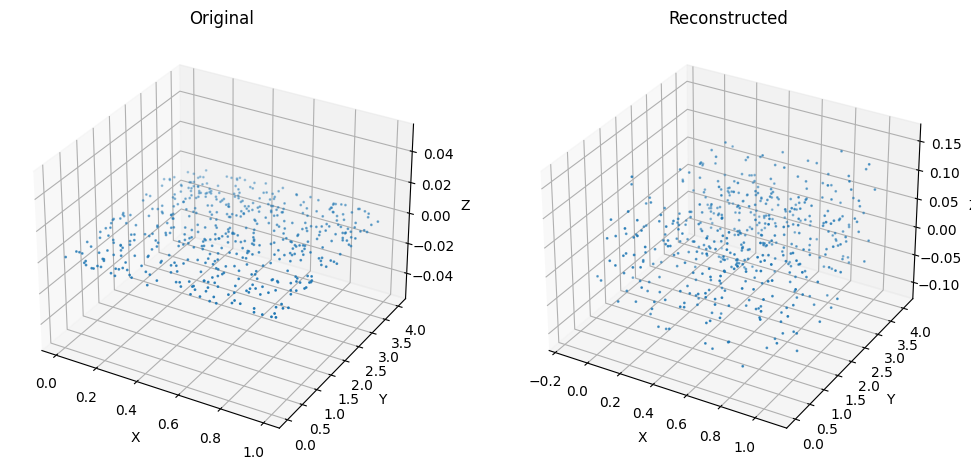

Epoch 461, Avg Loss: 0.1534858544667562
Epoch 462, Avg Loss: 0.46697806609639275
Epoch 463, Avg Loss: 0.23422119518121085
Epoch 464, Avg Loss: 0.07953936234116554
Epoch 465, Avg Loss: 0.20269615451494852
Epoch 466, Avg Loss: 0.1635221919665734
Epoch 467, Avg Loss: 0.0651810597628355
Epoch 468, Avg Loss: 0.24819184819352813
Epoch 469, Avg Loss: 0.09497051189343135
Epoch 470, Avg Loss: 0.15760512525836626
Epoch 471, Avg Loss: 0.058846883136235796
Epoch 472, Avg Loss: 0.054333461448550224
Epoch 473, Avg Loss: 0.09412845534582932
Epoch 474, Avg Loss: 0.02911795862019062
Epoch 475, Avg Loss: 0.04519235094388326
Epoch 476, Avg Loss: 0.03975767005855838
Epoch 477, Avg Loss: 0.0623891232535243
Epoch 478, Avg Loss: 0.028128664605901577
Epoch 479, Avg Loss: 0.05792228473971287
Epoch 480, Avg Loss: 0.02876451599392264


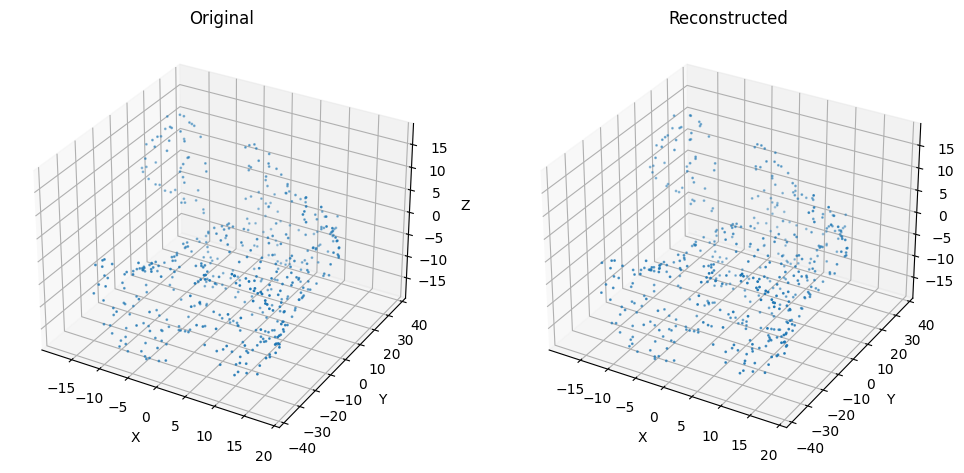

Epoch 481, Avg Loss: 0.05420737682531277
Epoch 482, Avg Loss: 0.029144740973909695
Epoch 483, Avg Loss: 0.1013588010003635
Epoch 484, Avg Loss: 0.06885271829863389
Epoch 485, Avg Loss: 0.09246042432884376
Epoch 486, Avg Loss: 0.02411486270527045
Epoch 487, Avg Loss: 0.047147009521722794
Epoch 488, Avg Loss: 0.05402645034094652
Epoch 489, Avg Loss: 0.02587621856946498
Epoch 490, Avg Loss: 0.08146761202563842
Epoch 491, Avg Loss: 0.07688201156755288
Epoch 492, Avg Loss: 0.026136392533468705
Epoch 493, Avg Loss: 0.11490557653208573
Epoch 494, Avg Loss: 0.014699718449264765
Epoch 495, Avg Loss: 0.04007661265010635
Epoch 496, Avg Loss: 0.016164802987380728
Epoch 497, Avg Loss: 0.05527742598981907
Epoch 498, Avg Loss: 0.006730634287426558
Epoch 499, Avg Loss: 0.09622863835344712
Epoch 500, Avg Loss: 0.03761972735325495


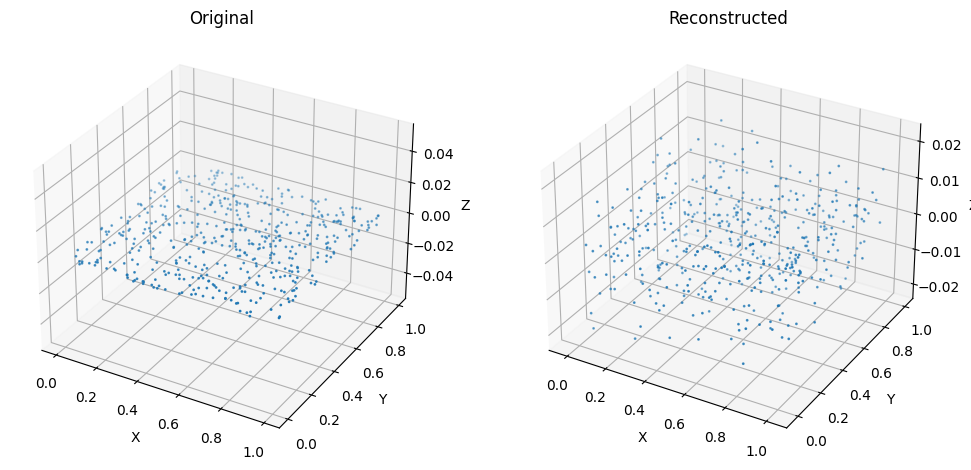

In [57]:
def train_and_visualize(point_clouds, epochs=100, lr=0.001, visualize_every_n_epochs=20, batch_size=4):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    autoencoder = PointNetAutoencoder().to(device)
    criterion = nn.MSELoss()
    optimizer = Adam(autoencoder.parameters(), lr=lr)
    point_clouds_tensor = torch.stack(point_clouds).to(device)  # Stack all point clouds into a single tensor

    # Calculate total number of batches
    num_batches = len(point_clouds_tensor) // batch_size + (1 if len(point_clouds_tensor) % batch_size > 0 else 0)

    for epoch in range(epochs):
        total_loss = 0

        # Shuffle the dataset at the beginning of each epoch
        indices = torch.randperm(len(point_clouds_tensor)).to(device)
        point_clouds_tensor = point_clouds_tensor[indices]

        for batch_idx in range(num_batches):
            start_idx = batch_idx * batch_size
            end_idx = start_idx + batch_size
            point_cloud_batch = point_clouds_tensor[start_idx:end_idx]

            # Forward pass
            reconstructed, _ = autoencoder(point_cloud_batch)
            loss = criterion(reconstructed, point_cloud_batch)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        avg_loss = total_loss / num_batches
        print(f"Epoch {epoch+1}, Avg Loss: {avg_loss}")

        # Visualization of the reconstruction at the end of an epoch
        if (epoch + 1) % visualize_every_n_epochs == 0:
            with torch.no_grad():
                sample_idx = torch.randint(len(point_clouds_tensor), (1,)).item()
                original = point_clouds_tensor[sample_idx].squeeze().cpu().numpy()
                reconstructed, _ = autoencoder(point_clouds_tensor[sample_idx].unsqueeze(0))
                reconstructed = reconstructed.squeeze().cpu().numpy()
                visualize_reconstruction(original, reconstructed, "Original", "Reconstructed")

    return autoencoder

# Example usage
if __name__ == "__main__":
    train_and_visualize(point_clouds, epochs=500, lr=0.001, visualize_every_n_epochs=20, batch_size=4)


In [14]:
def train_and_visualize_using_different_autoencoders_on_multiple_pointclouds(autoencoder, point_clouds, epochs=100, lr=0.001, visualize_every_n_epochs=20, batch_size=4):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    criterion = nn.MSELoss()
    optimizer = Adam(autoencoder.parameters(), lr=lr)
    point_clouds_tensor = torch.stack(point_clouds).to(device)  # Stack all point clouds into a single tensor

    # Calculate total number of batches
    num_batches = len(point_clouds_tensor) // batch_size + (1 if len(point_clouds_tensor) % batch_size > 0 else 0)

    for epoch in range(epochs):
        total_loss = 0

        # Shuffle the dataset at the beginning of each epoch
        indices = torch.randperm(len(point_clouds_tensor)).to(device)
        point_clouds_tensor = point_clouds_tensor[indices]

        for batch_idx in range(num_batches):
            start_idx = batch_idx * batch_size
            end_idx = start_idx + batch_size
            point_cloud_batch = point_clouds_tensor[start_idx:end_idx]

            # Forward pass
            reconstructed, _ = autoencoder(point_cloud_batch)
            loss = criterion(reconstructed, point_cloud_batch)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        avg_loss = total_loss / num_batches
        print(f"Epoch {epoch+1}, Avg Loss: {avg_loss}")

        # Visualization of the reconstruction at the end of an epoch
        if (epoch + 1) % visualize_every_n_epochs == 0:
            with torch.no_grad():
                sample_idx = torch.randint(len(point_clouds_tensor), (1,)).item()
                original = point_clouds_tensor[sample_idx].squeeze().cpu().numpy()
                reconstructed, _ = autoencoder(point_clouds_tensor[sample_idx].unsqueeze(0))
                reconstructed = reconstructed.squeeze().cpu().numpy()
                visualize_reconstruction(original, reconstructed, "Original", "Reconstructed")

In [28]:
def train_and_visualize_using_different_autoencoders_on_single_pointcloud(autoencoder, point_clouds, epochs=100, lr=0.001, visualize_every_n_epochs=20, point_cloud_index=4):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    autoencoder.to(device)
    criterion = nn.MSELoss()
    optimizer = Adam(autoencoder.parameters(), lr=lr)

    # Check if point_clouds is a list of tensors; if so, stack them. Otherwise, use it directly.
    if isinstance(point_clouds, list):
        point_clouds_tensor = torch.stack(point_clouds).to(device)
    else:
        point_clouds_tensor = point_clouds.to(device)

    point_cloud = point_clouds_tensor[point_cloud_index].unsqueeze(0)  # Select and add batch dimension

    for epoch in range(epochs):
        reconstructed, _ = autoencoder(point_cloud)
        loss = criterion(reconstructed, point_cloud)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (epoch + 1) % visualize_every_n_epochs == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Loss: {loss.item()}")
            with torch.no_grad():
                original = point_cloud.squeeze().cpu().numpy()  # Use the selected point cloud for visualization
                reconstructed, _ = autoencoder(point_cloud)
                reconstructed = reconstructed.squeeze().cpu().numpy()
                visualize_reconstruction(original, reconstructed, f"Original (Point Cloud {point_cloud_index+1})", "Reconstructed")


Training with latent size: 64






Epoch 50, Loss: 0.0006010321667417884


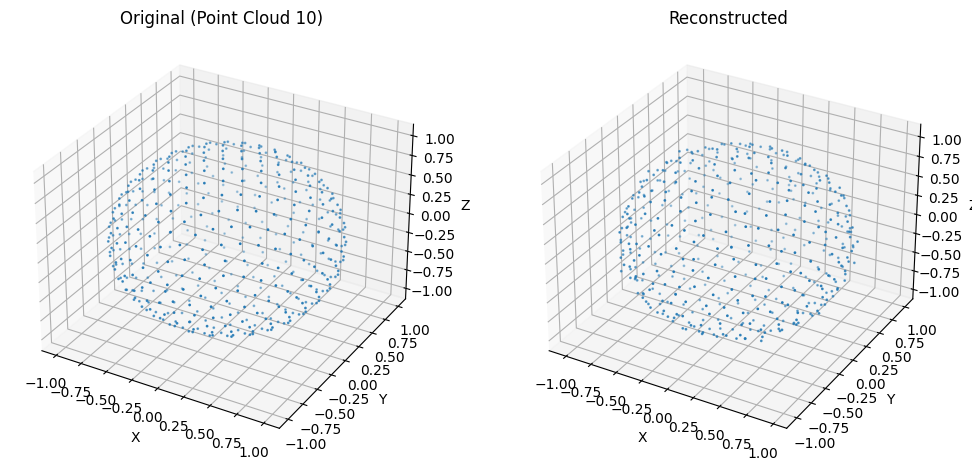

Epoch 100, Loss: 2.9548486963903997e-06


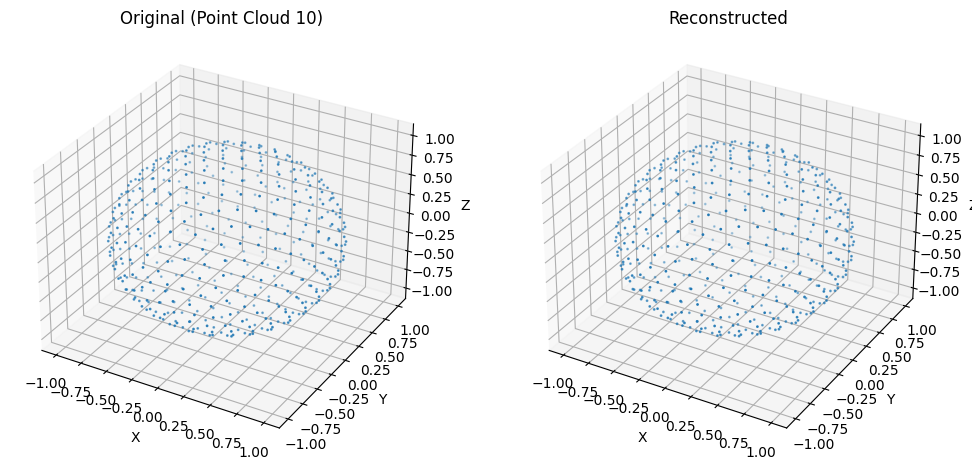

Training with latent size: 128






Epoch 50, Loss: 0.0007497742772102356


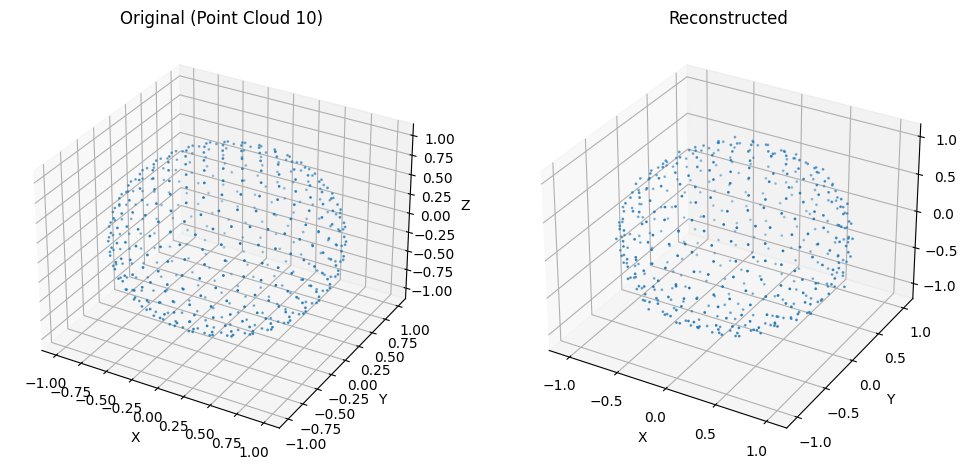

Epoch 100, Loss: 4.7683051889180206e-06


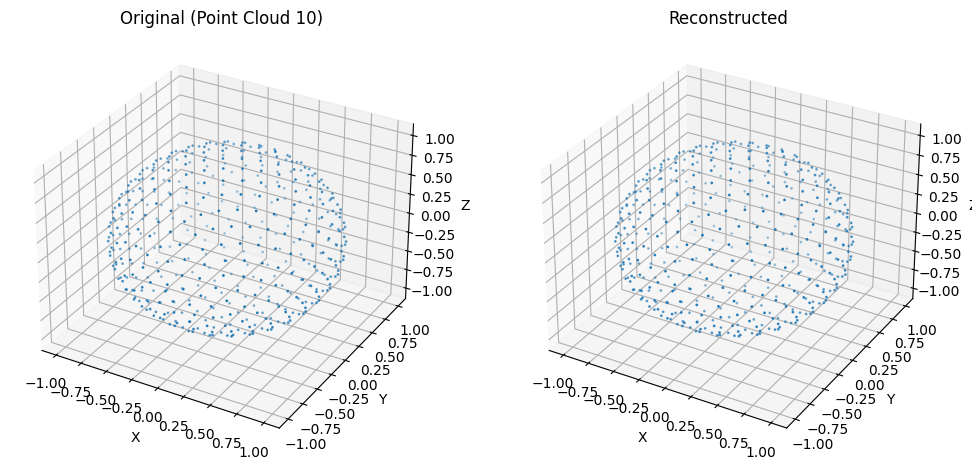

Training with latent size: 256






Epoch 50, Loss: 0.0005909452447667718


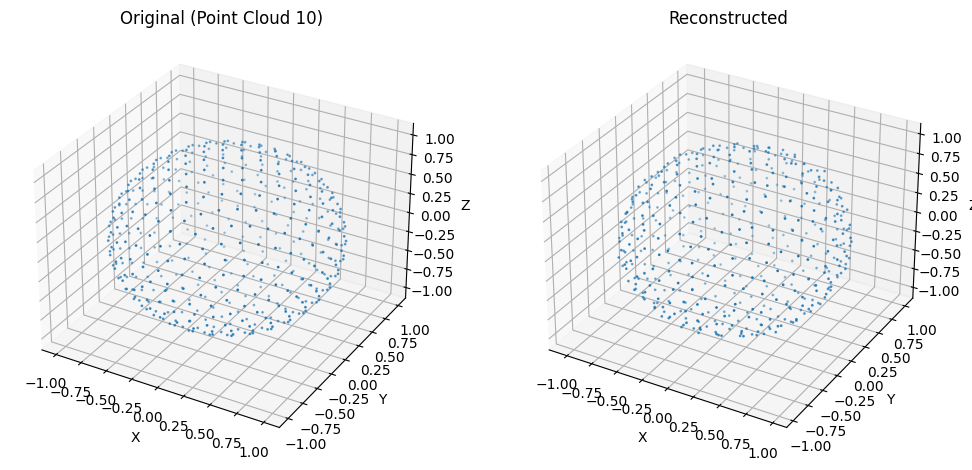

Epoch 100, Loss: 3.7480201626749476e-06


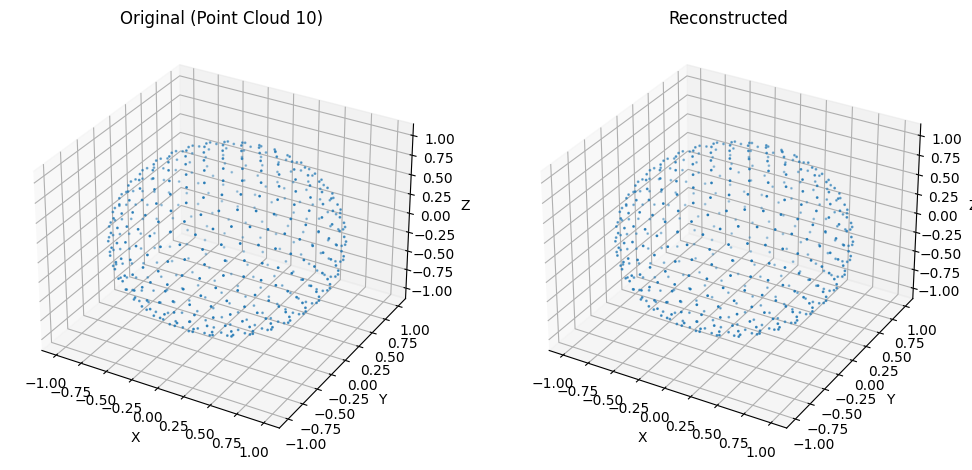

Training with latent size: 512






Epoch 50, Loss: 0.0005074870423413813


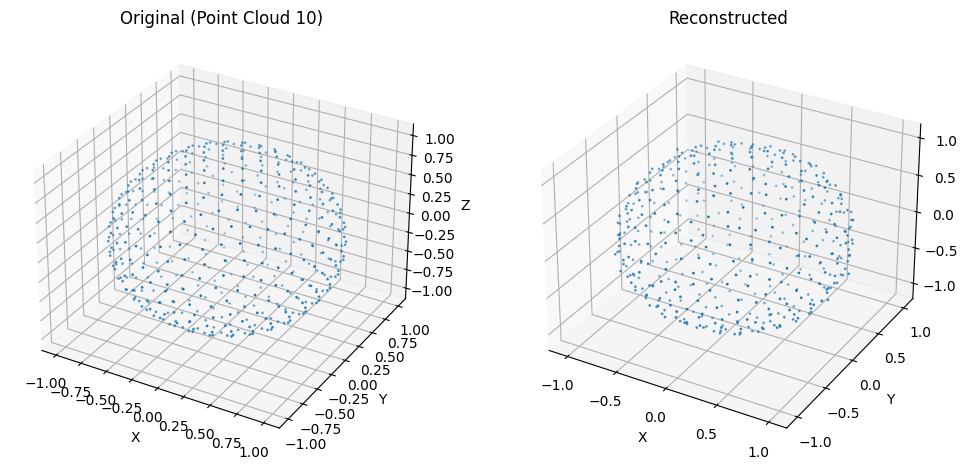

Epoch 100, Loss: 3.5884283988707466e-06


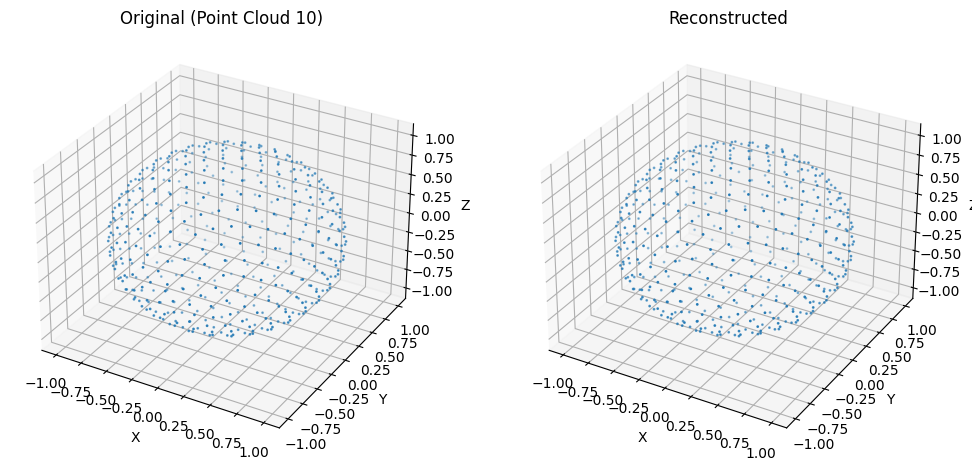

In [29]:
latent_sizes = [64, 128, 256, 512]  # Example latent sizes to experiment with
device = "cuda"

for latent_size in latent_sizes:
    print(f"Training with latent size: {latent_size}\n\n\n\n\n\n")
    autoencoder = PointNetAutoencoder(num_points=min_points, latent_size=latent_size).to(device)
    train_and_visualize_using_different_autoencoders_on_single_pointcloud(autoencoder, point_clouds, epochs=100, lr=0.001, visualize_every_n_epochs=50, point_cloud_index=9)

In [30]:
def train_autoencoder(autoencoder, point_clouds, epochs=100, lr=0.001, point_cloud_index=4):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    autoencoder.to(device)
    criterion = nn.MSELoss()
    optimizer = Adam(autoencoder.parameters(), lr=lr)

    if isinstance(point_clouds, list):
        point_clouds_tensor = torch.stack(point_clouds).to(device)
    else:
        point_clouds_tensor = point_clouds.to(device)

    point_cloud = point_clouds_tensor[point_cloud_index].unsqueeze(0)  # Select and add batch dimension
    losses = []  # List to record the loss at each epoch

    for epoch in range(epochs):
        optimizer.zero_grad()
        reconstructed, _ = autoencoder(point_cloud)
        loss = criterion(reconstructed, point_cloud)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())  # Record the loss

    return losses


Training with latent size: 8
Training with latent size: 16
Training with latent size: 32
Training with latent size: 64
Training with latent size: 128
Training with latent size: 256
Training with latent size: 512
Training with latent size: 1024
Training with latent size: 2048


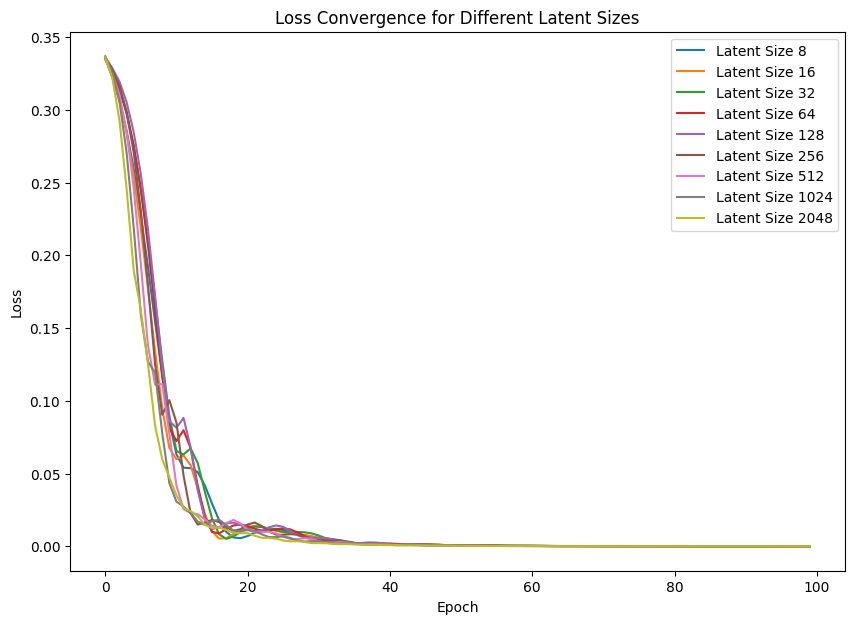

In [34]:
import matplotlib.pyplot as plt

def plot_loss_convergence_for_latent_sizes(latent_sizes, point_clouds, point_cloud_index, epochs=100, lr=0.001):
    loss_records = {}  # Dictionary to store losses for different latent sizes
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for latent_size in latent_sizes:
        print(f"Training with latent size: {latent_size}")
        autoencoder = PointNetAutoencoder(num_points=min_points, latent_size=latent_size).to(device)
        losses = train_autoencoder(autoencoder, point_clouds, epochs=epochs, lr=lr, point_cloud_index=point_cloud_index)
        loss_records[latent_size] = losses

    # Plotting the losses
    plt.figure(figsize=(10, 7))
    for latent_size, losses in loss_records.items():
        plt.plot(losses, label=f'Latent Size {latent_size}')

    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Convergence for Different Latent Sizes')
    plt.legend()
    plt.show()

# Example usage
latent_sizes = [8, 16, 32, 64, 128, 256, 512, 1024, 2048]
point_cloud_index = 9  # Example point cloud index
epochs = 100

plot_loss_convergence_for_latent_sizes(latent_sizes, point_clouds, point_cloud_index, epochs)


Training with latent size: 64
Training with latent size: 128
Training with latent size: 256
Training with latent size: 512
Training with latent size: 1024
Training with latent size: 2048


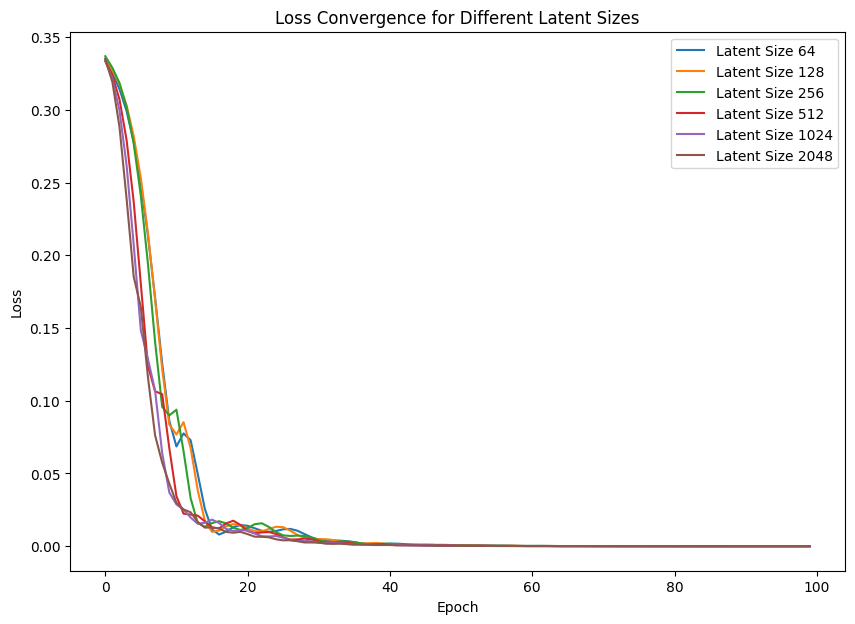

In [35]:
# Example usage
latent_sizes = [ 64, 128, 256, 512, 1024, 2048]
point_cloud_index = 9  # Example point cloud index
epochs = 100

plot_loss_convergence_for_latent_sizes(latent_sizes, point_clouds, point_cloud_index, epochs)

In [94]:
def encode_point_cloud(autoencoder, model_input):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    autoencoder.to(device).eval()  # Move to device and set to evaluation mode
    with torch.no_grad():
        # Directly use model_input which is already ensured to be [1, 3, num_points]
        print(f"Input shape to the model: {model_input.transpose(1, 2).shape}")
        _, latent_representation = autoencoder(model_input.to(device).transpose(1, 2))
    return latent_representation.squeeze().cpu().numpy()


Epoch 1, Avg Loss: 130.81043115258217
Epoch 2, Avg Loss: 129.72553253173828
Epoch 3, Avg Loss: 122.87707010904948
Epoch 4, Avg Loss: 112.48503112792969
Epoch 5, Avg Loss: 104.27560933430989
Epoch 6, Avg Loss: 99.52579116821289
Epoch 7, Avg Loss: 96.78999328613281
Epoch 8, Avg Loss: 96.76302083333333
Epoch 9, Avg Loss: 101.31769688924153
Epoch 10, Avg Loss: 95.17481994628906
Epoch 11, Avg Loss: 94.67105865478516
Epoch 12, Avg Loss: 93.44687143961589
Epoch 13, Avg Loss: 99.6338284810384
Epoch 14, Avg Loss: 92.03972625732422
Epoch 15, Avg Loss: 96.92564010620117
Epoch 16, Avg Loss: 88.52786254882812
Epoch 17, Avg Loss: 88.67338943481445
Epoch 18, Avg Loss: 88.98297500610352
Epoch 19, Avg Loss: 87.21782384316127
Epoch 20, Avg Loss: 80.44287745157878


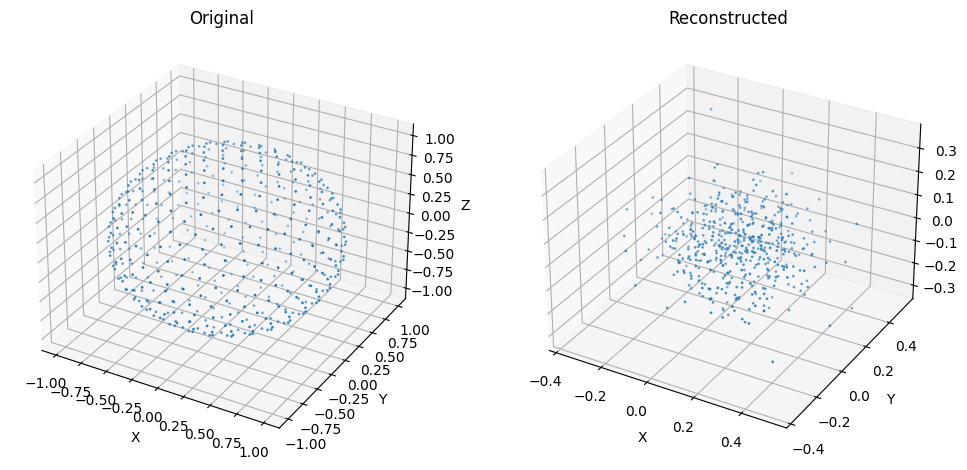

Epoch 21, Avg Loss: 75.07553990681966
Epoch 22, Avg Loss: 79.14352905750275
Epoch 23, Avg Loss: 75.41149139404297
Epoch 24, Avg Loss: 69.85514831542969
Epoch 25, Avg Loss: 65.22336069742839
Epoch 26, Avg Loss: 66.40856806437175
Epoch 27, Avg Loss: 58.2557118733724
Epoch 28, Avg Loss: 53.3393440246582
Epoch 29, Avg Loss: 49.84715779622396
Epoch 30, Avg Loss: 50.17248662312826
Epoch 31, Avg Loss: 41.74931812286377
Epoch 32, Avg Loss: 43.81615447998047
Epoch 33, Avg Loss: 41.2742271622022
Epoch 34, Avg Loss: 32.068537871042885
Epoch 35, Avg Loss: 30.194377501805622
Epoch 36, Avg Loss: 26.73409082988898
Epoch 37, Avg Loss: 29.85679657260577
Epoch 38, Avg Loss: 26.5033057530721
Epoch 39, Avg Loss: 24.866060256958008
Epoch 40, Avg Loss: 19.2229323387146


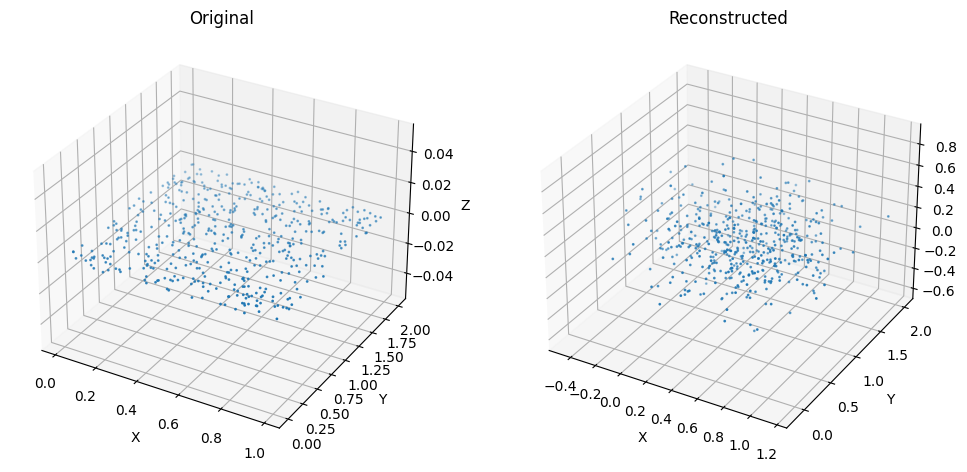

Epoch 41, Avg Loss: 21.139997283617657
Epoch 42, Avg Loss: 22.542423407236736
Epoch 43, Avg Loss: 21.59342908859253
Epoch 44, Avg Loss: 17.434823989868164
Epoch 45, Avg Loss: 16.264314730962116
Epoch 46, Avg Loss: 15.315040111541748
Epoch 47, Avg Loss: 13.15966018040975
Epoch 48, Avg Loss: 14.457953368624052
Epoch 49, Avg Loss: 11.020049929618835
Epoch 50, Avg Loss: 8.653230587641398
Epoch 51, Avg Loss: 6.538739204406738
Epoch 52, Avg Loss: 6.723192771275838
Epoch 53, Avg Loss: 11.27260517080625
Epoch 54, Avg Loss: 4.759880945086479
Epoch 55, Avg Loss: 13.126776695251465
Epoch 56, Avg Loss: 6.284541130065918
Epoch 57, Avg Loss: 8.947550932566324
Epoch 58, Avg Loss: 4.851178626219432
Epoch 59, Avg Loss: 2.7684489289919534
Epoch 60, Avg Loss: 4.450762112935384


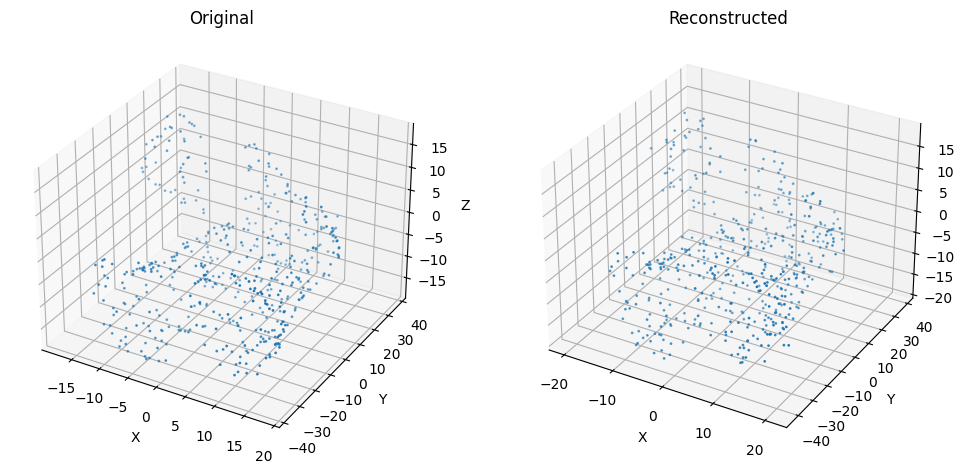

Epoch 61, Avg Loss: 1.7319293568531673
Epoch 62, Avg Loss: 1.4878075520197551
Epoch 63, Avg Loss: 1.696604569753011
Epoch 64, Avg Loss: 0.9157706300417582
Epoch 65, Avg Loss: 0.9117591579755148
Epoch 66, Avg Loss: 1.2986661394437153
Epoch 67, Avg Loss: 1.033422162135442
Epoch 68, Avg Loss: 0.7356516818205515
Epoch 69, Avg Loss: 1.5085367560386658
Epoch 70, Avg Loss: 0.7948335856199265
Epoch 71, Avg Loss: 1.4431239863236744
Epoch 72, Avg Loss: 0.727052241563797
Epoch 73, Avg Loss: 1.8115019102891285
Epoch 74, Avg Loss: 0.6412797619899114
Epoch 75, Avg Loss: 1.0097070535024006
Epoch 76, Avg Loss: 0.3348665237426758
Epoch 77, Avg Loss: 0.6590640346209208
Epoch 78, Avg Loss: 0.5021012971798579
Epoch 79, Avg Loss: 0.2843017876148224
Epoch 80, Avg Loss: 0.4066678782304128


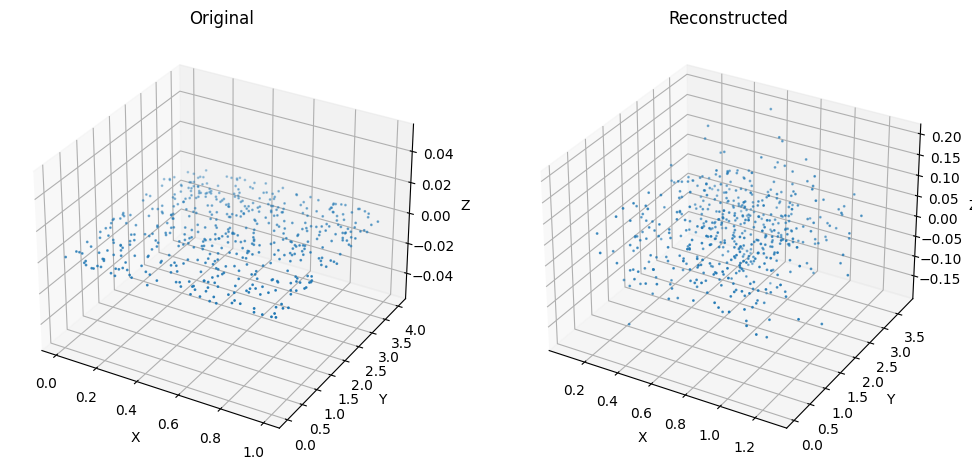

Epoch 81, Avg Loss: 0.15301755567391714
Epoch 82, Avg Loss: 0.5050882548093796
Epoch 83, Avg Loss: 0.2194229265054067
Epoch 84, Avg Loss: 1.0266316433747609
Epoch 85, Avg Loss: 0.4401105170448621
Epoch 86, Avg Loss: 0.2359126259883245
Epoch 87, Avg Loss: 0.7404703497886658
Epoch 88, Avg Loss: 0.2741620937983195
Epoch 89, Avg Loss: 1.226055088142554
Epoch 90, Avg Loss: 0.20692256589730582
Epoch 91, Avg Loss: 0.3183874587217967
Epoch 92, Avg Loss: 0.2842102299133937
Epoch 93, Avg Loss: 0.4529186387856801
Epoch 94, Avg Loss: 0.7199666003386179
Epoch 95, Avg Loss: 0.4944958488146464
Epoch 96, Avg Loss: 1.322870135307312
Epoch 97, Avg Loss: 0.6965477168560028
Epoch 98, Avg Loss: 0.42136729260285694
Epoch 99, Avg Loss: 0.7772516012191772
Epoch 100, Avg Loss: 0.21544923384984335


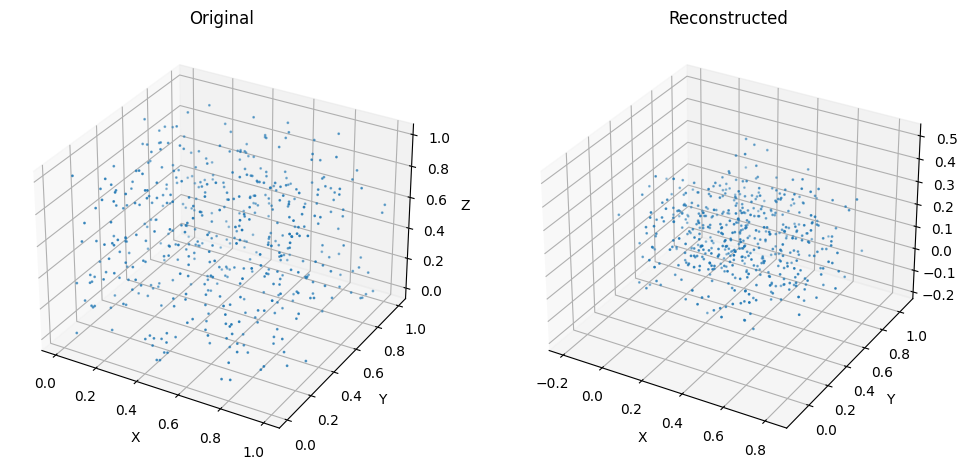

Epoch 101, Avg Loss: 0.1983360250790914
Epoch 102, Avg Loss: 0.5448026458422343
Epoch 103, Avg Loss: 0.24289621909459433
Epoch 104, Avg Loss: 0.721305251121521
Epoch 105, Avg Loss: 0.32754424462715787
Epoch 106, Avg Loss: 0.26959384232759476
Epoch 107, Avg Loss: 0.16527917236089706
Epoch 108, Avg Loss: 0.2746877868970235
Epoch 109, Avg Loss: 0.13678613801797232
Epoch 110, Avg Loss: 0.21578298757473627
Epoch 111, Avg Loss: 0.15879637002944946
Epoch 112, Avg Loss: 0.16360842684904733
Epoch 113, Avg Loss: 0.10712671528259914
Epoch 114, Avg Loss: 0.09555916612346967
Epoch 115, Avg Loss: 0.10269974668820699
Epoch 116, Avg Loss: 0.09970018515984218
Epoch 117, Avg Loss: 0.08972128356496493
Epoch 118, Avg Loss: 0.09017999097704887
Epoch 119, Avg Loss: 0.08929102495312691
Epoch 120, Avg Loss: 0.07462896406650543


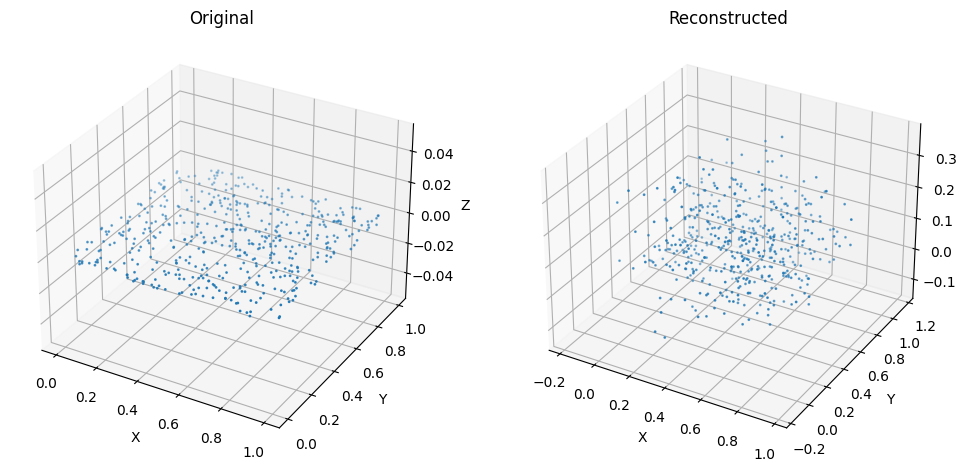

Epoch 121, Avg Loss: 0.07439971218506496
Epoch 122, Avg Loss: 0.07017987966537476
Epoch 123, Avg Loss: 0.09312740713357925
Epoch 124, Avg Loss: 0.07025421783328056
Epoch 125, Avg Loss: 0.11050958931446075
Epoch 126, Avg Loss: 0.07254838943481445
Epoch 127, Avg Loss: 0.08267202228307724
Epoch 128, Avg Loss: 0.06674844616403182
Epoch 129, Avg Loss: 0.0644517174611489
Epoch 130, Avg Loss: 0.06684822713335355
Epoch 131, Avg Loss: 0.05911462257305781
Epoch 132, Avg Loss: 0.07168990497787793
Epoch 133, Avg Loss: 0.060912334670623146
Epoch 134, Avg Loss: 0.07240740520258744
Epoch 135, Avg Loss: 0.05507107824087143
Epoch 136, Avg Loss: 0.06432343771060307
Epoch 137, Avg Loss: 0.04808515558640162
Epoch 138, Avg Loss: 0.07416632771492004
Epoch 139, Avg Loss: 0.07295333345731099
Epoch 140, Avg Loss: 0.04960975299278895


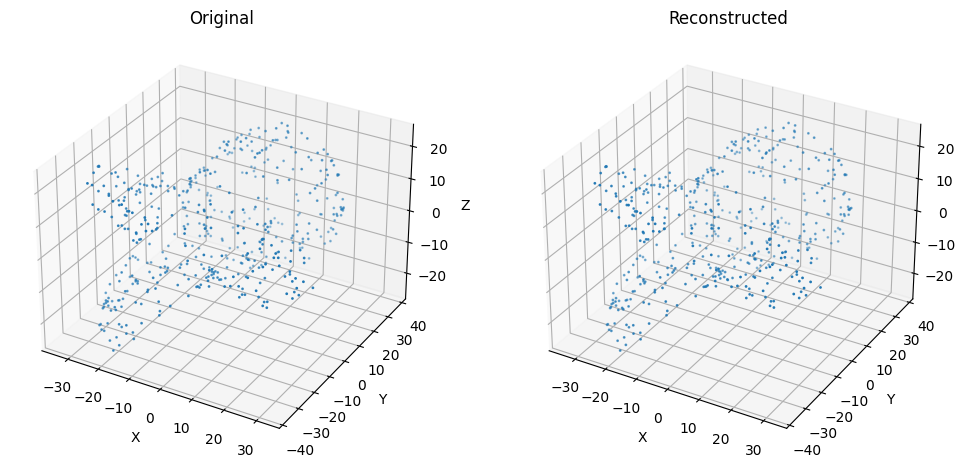

Epoch 141, Avg Loss: 0.06425103234748046
Epoch 142, Avg Loss: 0.04859547301506003
Epoch 143, Avg Loss: 0.05859358484546343
Epoch 144, Avg Loss: 0.04502599282811085
Epoch 145, Avg Loss: 0.05253393637637297
Epoch 146, Avg Loss: 0.04243202072878679
Epoch 147, Avg Loss: 0.042870361978809036
Epoch 148, Avg Loss: 0.04286827395359675
Epoch 149, Avg Loss: 0.045832683642705284
Epoch 150, Avg Loss: 0.04354887673010429
Epoch 151, Avg Loss: 0.04249944103260835
Epoch 152, Avg Loss: 0.04412874082724253
Epoch 153, Avg Loss: 0.03966723382472992
Epoch 154, Avg Loss: 0.0355837078144153
Epoch 155, Avg Loss: 0.04075765039306134
Epoch 156, Avg Loss: 0.038412669052680336
Epoch 157, Avg Loss: 0.04075107009460529
Epoch 158, Avg Loss: 0.03655627680321535
Epoch 159, Avg Loss: 0.035699519173552595
Epoch 160, Avg Loss: 0.0325192641466856


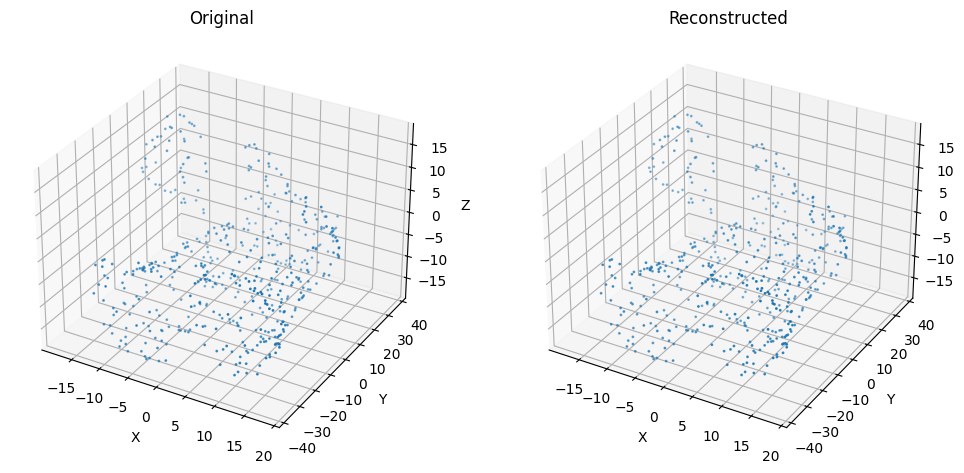

Epoch 161, Avg Loss: 0.03388521385689577
Epoch 162, Avg Loss: 0.03511682835717996
Epoch 163, Avg Loss: 0.030709185016651947
Epoch 164, Avg Loss: 0.03005530529965957
Epoch 165, Avg Loss: 0.029634402482770383
Epoch 166, Avg Loss: 0.029691317429145176
Epoch 167, Avg Loss: 0.031142867480715115
Epoch 168, Avg Loss: 0.028644309068719547
Epoch 169, Avg Loss: 0.02869272232055664
Epoch 170, Avg Loss: 0.03209535637870431
Epoch 171, Avg Loss: 0.02933541330276057
Epoch 172, Avg Loss: 0.029071684926748276
Epoch 173, Avg Loss: 0.026021306092540424
Epoch 174, Avg Loss: 0.028556046076118946
Epoch 175, Avg Loss: 0.024810282591109473
Epoch 176, Avg Loss: 0.025693105533719063
Epoch 177, Avg Loss: 0.02631239468852679
Epoch 178, Avg Loss: 0.024711853824555874
Epoch 179, Avg Loss: 0.023622695356607437
Epoch 180, Avg Loss: 0.02624108735471964


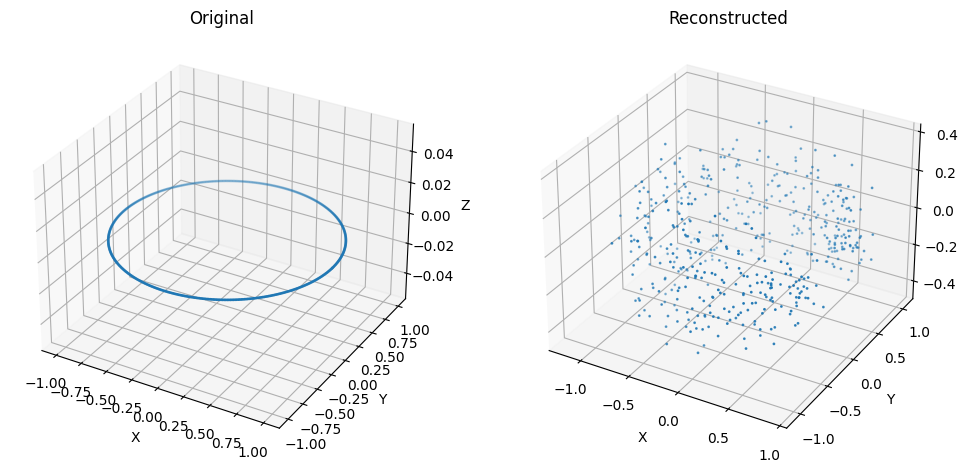

Epoch 181, Avg Loss: 0.023454814062764246
Epoch 182, Avg Loss: 0.022192540500933926
Epoch 183, Avg Loss: 0.024278526660054922
Epoch 184, Avg Loss: 0.020642436264703672
Epoch 185, Avg Loss: 0.021437058225274086
Epoch 186, Avg Loss: 0.02232228612410836
Epoch 187, Avg Loss: 0.021118546836078167
Epoch 188, Avg Loss: 0.02301028184592724
Epoch 189, Avg Loss: 0.019526779962082703
Epoch 190, Avg Loss: 0.02022028559197982
Epoch 191, Avg Loss: 0.019302292726933956
Epoch 192, Avg Loss: 0.016670226585119963
Epoch 193, Avg Loss: 0.01898628706112504
Epoch 194, Avg Loss: 0.01781987336774667
Epoch 195, Avg Loss: 0.016931057907640934
Epoch 196, Avg Loss: 0.01658574988444646
Epoch 197, Avg Loss: 0.01717586776552101
Epoch 198, Avg Loss: 0.015950351643065613
Epoch 199, Avg Loss: 0.014408910957475504
Epoch 200, Avg Loss: 0.013611046907802423


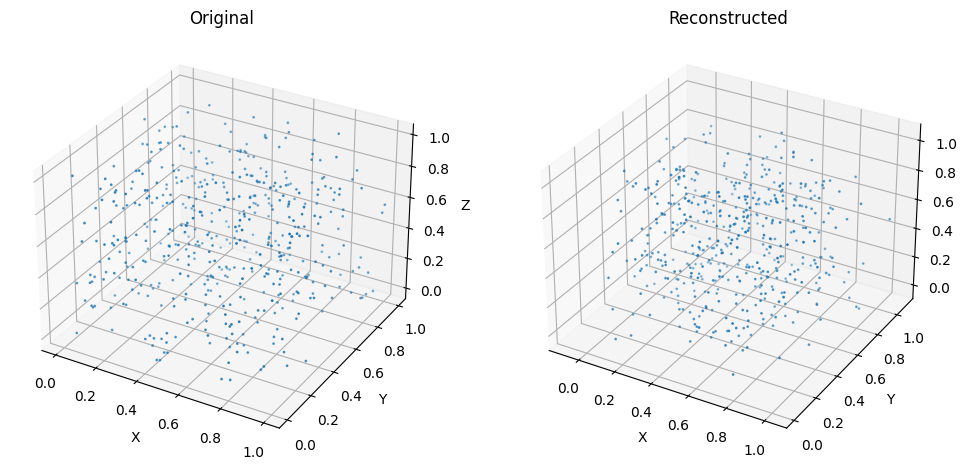

Epoch 201, Avg Loss: 0.016123446791122358
Epoch 202, Avg Loss: 0.017427072239418823
Epoch 203, Avg Loss: 0.01730875453601281
Epoch 204, Avg Loss: 0.01447237515822053
Epoch 205, Avg Loss: 0.019741685905804236
Epoch 206, Avg Loss: 0.015473922986226777
Epoch 207, Avg Loss: 0.040443296233812966
Epoch 208, Avg Loss: 0.0700157613803943
Epoch 209, Avg Loss: 0.05194144664953152
Epoch 210, Avg Loss: 0.13371622065703073
Epoch 211, Avg Loss: 0.05994007736444473
Epoch 212, Avg Loss: 0.08489649401356776
Epoch 213, Avg Loss: 0.1809127057592074
Epoch 214, Avg Loss: 0.1959850825369358
Epoch 215, Avg Loss: 0.024104214273393154
Epoch 216, Avg Loss: 0.38198032478491467
Epoch 217, Avg Loss: 0.09958073310554028
Epoch 218, Avg Loss: 0.17192942276597023
Epoch 219, Avg Loss: 0.22879580905040106
Epoch 220, Avg Loss: 0.09400167440374692


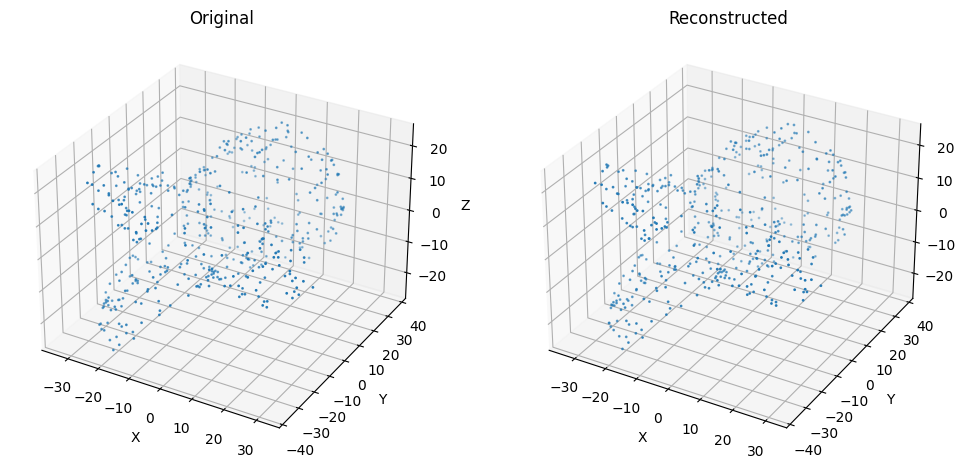

Epoch 221, Avg Loss: 0.13224917774399123
Epoch 222, Avg Loss: 0.12078018610676129
Epoch 223, Avg Loss: 0.08171298292775948
Epoch 224, Avg Loss: 0.06444825604557991
Epoch 225, Avg Loss: 0.02876801664630572
Epoch 226, Avg Loss: 0.04971060032645861
Epoch 227, Avg Loss: 0.04695507977157831
Epoch 228, Avg Loss: 0.19004481534163156
Epoch 229, Avg Loss: 0.24631344651182493
Epoch 230, Avg Loss: 0.4911682444314162
Epoch 231, Avg Loss: 0.7362310489018759
Epoch 232, Avg Loss: 0.6494870359698931
Epoch 233, Avg Loss: 0.5530376334985098
Epoch 234, Avg Loss: 0.5505743424097697
Epoch 235, Avg Loss: 1.5094234943389893
Epoch 236, Avg Loss: 1.636388230137527
Epoch 237, Avg Loss: 0.7670267721017202
Epoch 238, Avg Loss: 2.25144095843037
Epoch 239, Avg Loss: 2.611857552314177
Epoch 240, Avg Loss: 1.4791808342561126


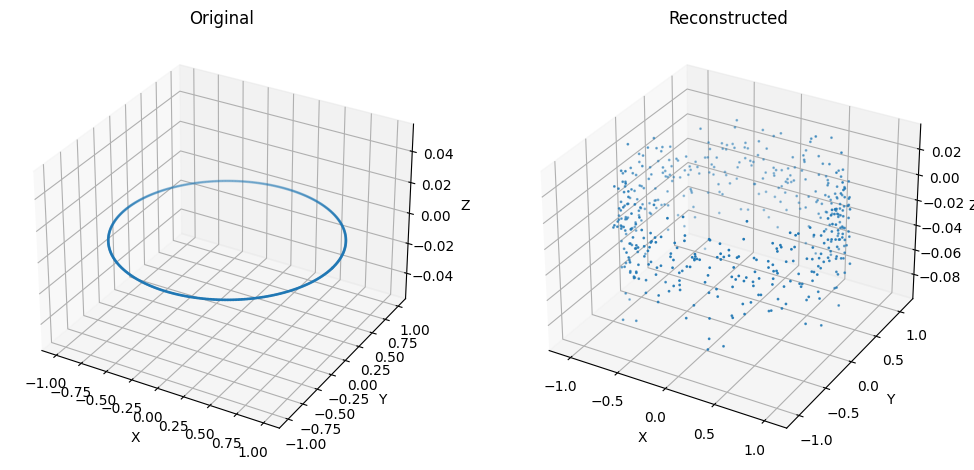

Epoch 241, Avg Loss: 5.187471946080525
Epoch 242, Avg Loss: 3.1491336822509766
Epoch 243, Avg Loss: 4.038207514677197
Epoch 244, Avg Loss: 6.960040191809337
Epoch 245, Avg Loss: 2.3213977813720703
Epoch 246, Avg Loss: 7.420322020848592
Epoch 247, Avg Loss: 5.770163297653198
Epoch 248, Avg Loss: 3.3452600638071694
Epoch 249, Avg Loss: 1.5770576198895772
Epoch 250, Avg Loss: 1.7194155926505725
Epoch 251, Avg Loss: 1.9434583882490795
Epoch 252, Avg Loss: 1.5973613411188126
Epoch 253, Avg Loss: 3.667671263217926
Epoch 254, Avg Loss: 0.9094896415869395
Epoch 255, Avg Loss: 2.0473268663821123
Epoch 256, Avg Loss: 1.4052144885063171
Epoch 257, Avg Loss: 0.48742181062698364
Epoch 258, Avg Loss: 1.1980897188186646
Epoch 259, Avg Loss: 0.9974134564399719
Epoch 260, Avg Loss: 0.6368359668801228


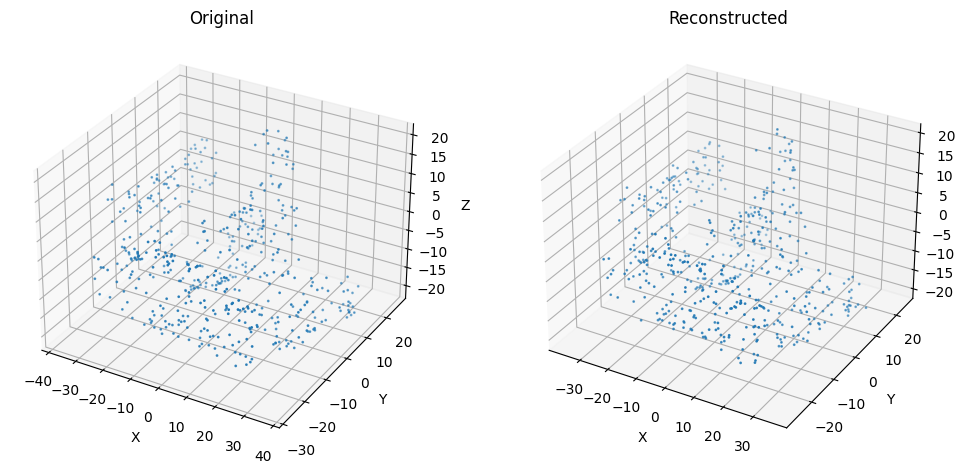

Epoch 261, Avg Loss: 1.1038813814520836
Epoch 262, Avg Loss: 0.689286415775617
Epoch 263, Avg Loss: 0.6382019060353438
Epoch 264, Avg Loss: 0.6792617663741112
Epoch 265, Avg Loss: 0.33792400546371937
Epoch 266, Avg Loss: 0.25523923337459564
Epoch 267, Avg Loss: 0.4244016607602437
Epoch 268, Avg Loss: 0.12192462392461796
Epoch 269, Avg Loss: 0.19496460258960724
Epoch 270, Avg Loss: 0.14404887581864992
Epoch 271, Avg Loss: 0.08633105829358101
Epoch 272, Avg Loss: 0.06441680900752544
Epoch 273, Avg Loss: 0.2633457500487566
Epoch 274, Avg Loss: 0.1925854173799356
Epoch 275, Avg Loss: 0.22562932471434274
Epoch 276, Avg Loss: 0.5124851160993179
Epoch 277, Avg Loss: 0.1500030110279719
Epoch 278, Avg Loss: 1.2470288624366124
Epoch 279, Avg Loss: 0.4137371927499771
Epoch 280, Avg Loss: 3.715255618095398


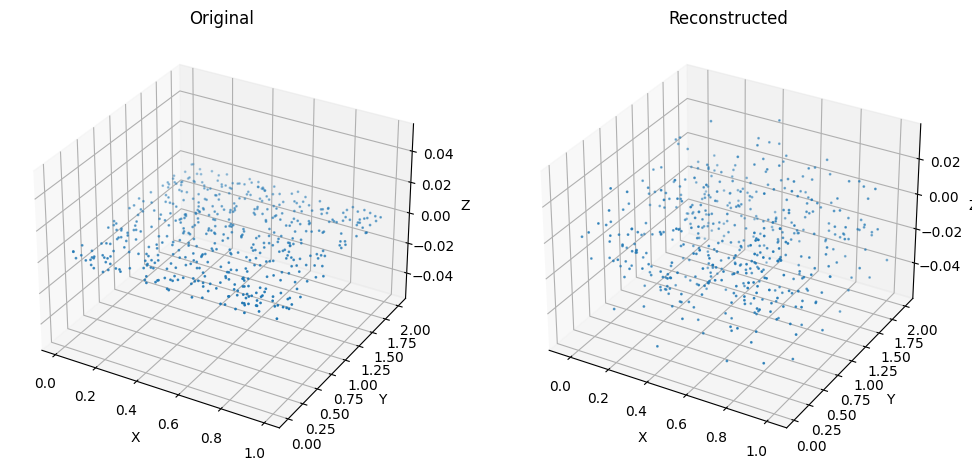

Epoch 281, Avg Loss: 1.4149521936972935
Epoch 282, Avg Loss: 1.1697859366734822
Epoch 283, Avg Loss: 1.5829945386697848
Epoch 284, Avg Loss: 0.5848969692985216
Epoch 285, Avg Loss: 0.43417278428872425
Epoch 286, Avg Loss: 1.157938838005066
Epoch 287, Avg Loss: 0.6604297061761221
Epoch 288, Avg Loss: 0.4650306162269165
Epoch 289, Avg Loss: 0.5129723697900772
Epoch 290, Avg Loss: 0.3153138905763626
Epoch 291, Avg Loss: 0.2753303150335948
Epoch 292, Avg Loss: 0.19503190108419707
Epoch 293, Avg Loss: 0.06721689893553655
Epoch 294, Avg Loss: 0.32104250912865
Epoch 295, Avg Loss: 0.0690495731929938
Epoch 296, Avg Loss: 0.05288711809165155
Epoch 297, Avg Loss: 0.07730526632318895
Epoch 298, Avg Loss: 0.01691815908998251
Epoch 299, Avg Loss: 0.03583523683482781
Epoch 300, Avg Loss: 0.015616216619188586


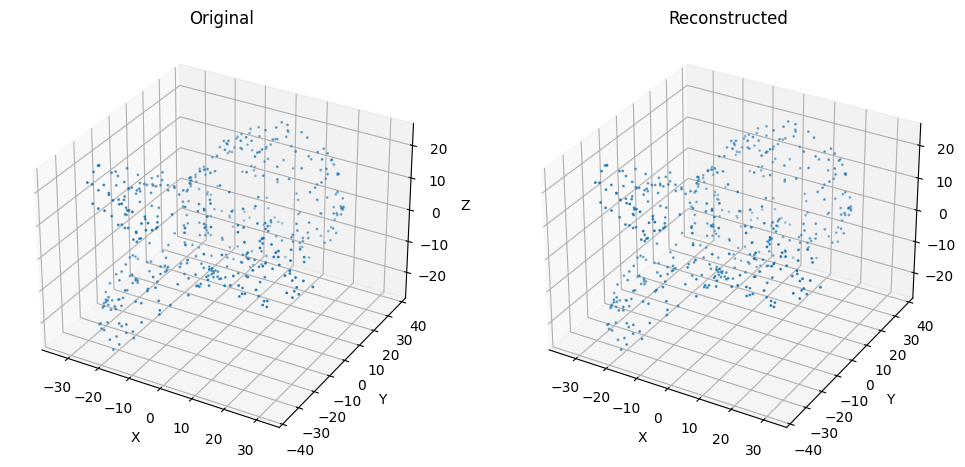

Epoch 301, Avg Loss: 0.014919714536517859
Epoch 302, Avg Loss: 0.015064431199183067
Epoch 303, Avg Loss: 0.005386458321784933
Epoch 304, Avg Loss: 0.01140640404385825
Epoch 305, Avg Loss: 0.005985694161305825
Epoch 306, Avg Loss: 0.008484558512767157
Epoch 307, Avg Loss: 0.009718102985061705
Epoch 308, Avg Loss: 0.0033360468223690987
Epoch 309, Avg Loss: 0.004910190124064684
Epoch 310, Avg Loss: 0.005992460181005299
Epoch 311, Avg Loss: 0.00312143808696419
Epoch 312, Avg Loss: 0.0038350384371976056
Epoch 313, Avg Loss: 0.0029418636695481837
Epoch 314, Avg Loss: 0.001556253875605762
Epoch 315, Avg Loss: 0.002528638889392217
Epoch 316, Avg Loss: 0.001587830998081093
Epoch 317, Avg Loss: 0.0009143856489875665
Epoch 318, Avg Loss: 0.0019098719349130988
Epoch 319, Avg Loss: 0.0006829409636945153
Epoch 320, Avg Loss: 0.000473503430839628


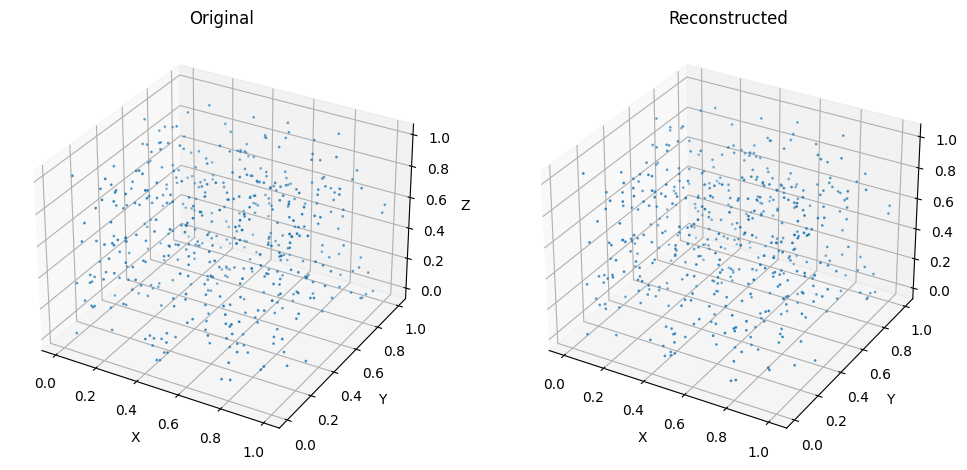

Epoch 321, Avg Loss: 0.0010156728142950062
Epoch 322, Avg Loss: 0.000430625169731987
Epoch 323, Avg Loss: 0.00039101942578175414
Epoch 324, Avg Loss: 0.0004563198065928494
Epoch 325, Avg Loss: 0.00023350575065705925
Epoch 326, Avg Loss: 0.00016423669148935005
Epoch 327, Avg Loss: 0.00020001914041737714
Epoch 328, Avg Loss: 0.000139819057949353
Epoch 329, Avg Loss: 0.0001020485118109112
Epoch 330, Avg Loss: 9.444238821743056e-05
Epoch 331, Avg Loss: 9.799442705116235e-05
Epoch 332, Avg Loss: 8.850338660219374e-05
Epoch 333, Avg Loss: 7.808107572297256e-05
Epoch 334, Avg Loss: 6.333036314269218e-05
Epoch 335, Avg Loss: 6.234635778431159e-05
Epoch 336, Avg Loss: 6.900849621160887e-05
Epoch 337, Avg Loss: 5.354302750977998e-05
Epoch 338, Avg Loss: 6.947554963214013e-05
Epoch 339, Avg Loss: 5.723849365798136e-05
Epoch 340, Avg Loss: 4.7300666968415804e-05


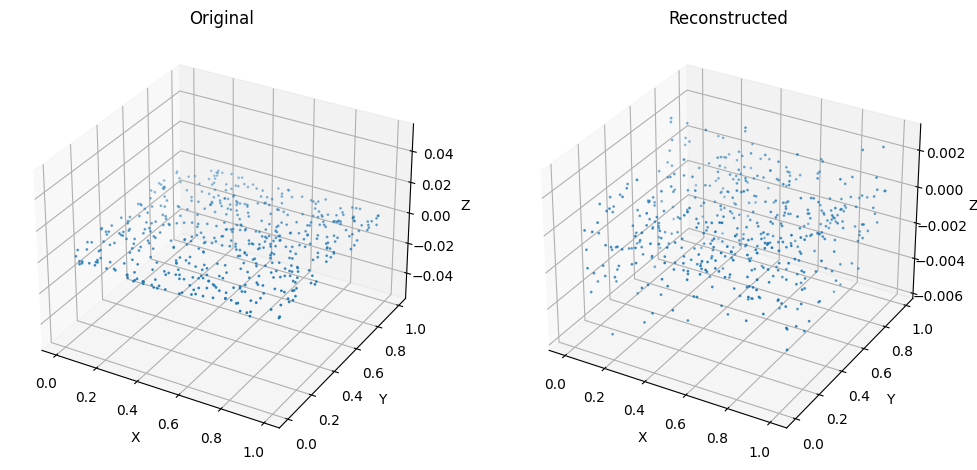

Epoch 341, Avg Loss: 6.234985994524322e-05
Epoch 342, Avg Loss: 3.202223418459956e-05
Epoch 343, Avg Loss: 3.706965071614832e-05
Epoch 344, Avg Loss: 2.9653596963422995e-05
Epoch 345, Avg Loss: 3.530953169198862e-05
Epoch 346, Avg Loss: 2.9675352531436754e-05
Epoch 347, Avg Loss: 2.9728971033667524e-05
Epoch 348, Avg Loss: 2.4299786673509516e-05
Epoch 349, Avg Loss: 2.4154270704457304e-05
Epoch 350, Avg Loss: 2.423891358679005e-05
Epoch 351, Avg Loss: 2.216398199076745e-05
Epoch 352, Avg Loss: 2.0443450315118145e-05
Epoch 353, Avg Loss: 1.9382513528398704e-05
Epoch 354, Avg Loss: 1.8098068418718565e-05
Epoch 355, Avg Loss: 1.9083665999157045e-05
Epoch 356, Avg Loss: 1.6372662988336135e-05
Epoch 357, Avg Loss: 1.713212547353275e-05
Epoch 358, Avg Loss: 1.403077309684401e-05
Epoch 359, Avg Loss: 1.4112930026991913e-05
Epoch 360, Avg Loss: 1.2798687597144939e-05


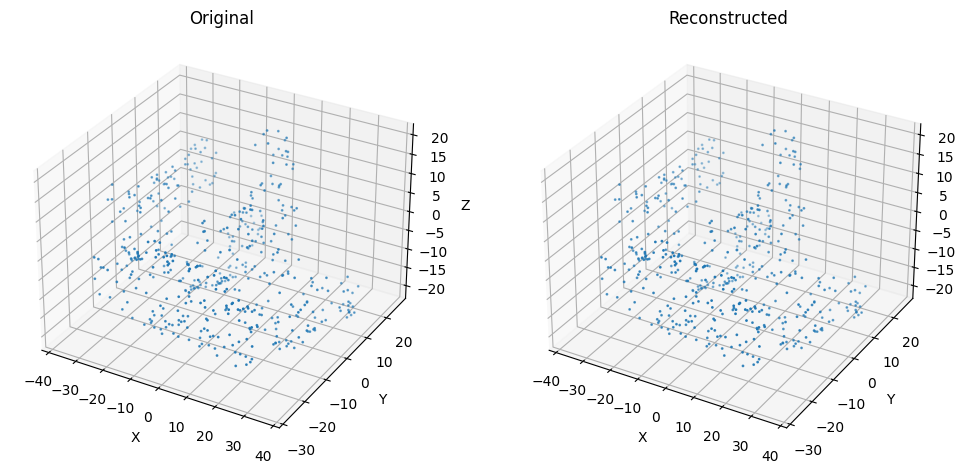

Epoch 361, Avg Loss: 1.2852059019981729e-05
Epoch 362, Avg Loss: 1.2271705903306914e-05
Epoch 363, Avg Loss: 1.1463504658119442e-05
Epoch 364, Avg Loss: 1.2333850312037006e-05
Epoch 365, Avg Loss: 1.1848462236230262e-05
Epoch 366, Avg Loss: 9.80514505499741e-06
Epoch 367, Avg Loss: 1.0392598748391416e-05
Epoch 368, Avg Loss: 9.103549852322127e-06
Epoch 369, Avg Loss: 8.700311620183735e-06
Epoch 370, Avg Loss: 8.944908283107603e-06
Epoch 371, Avg Loss: 7.907806661933137e-06
Epoch 372, Avg Loss: 7.542040028359527e-06
Epoch 373, Avg Loss: 7.325104112017773e-06
Epoch 374, Avg Loss: 6.918850791256166e-06
Epoch 375, Avg Loss: 6.821426571453533e-06
Epoch 376, Avg Loss: 7.663416615362925e-06
Epoch 377, Avg Loss: 6.903734326139481e-06
Epoch 378, Avg Loss: 6.2090083095730124e-06
Epoch 379, Avg Loss: 6.334741707784512e-06
Epoch 380, Avg Loss: 6.540755805417575e-06


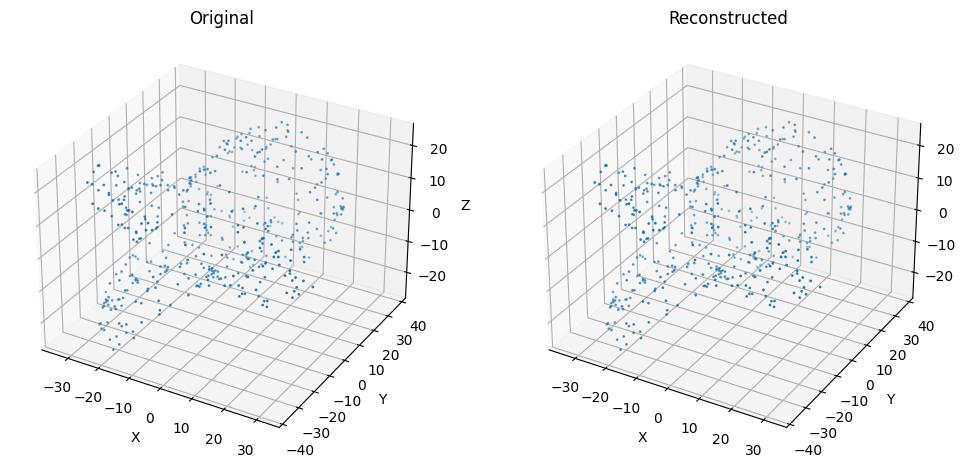

Epoch 381, Avg Loss: 6.640272810424601e-06
Epoch 382, Avg Loss: 5.9397403333605325e-06
Epoch 383, Avg Loss: 1.2758925398278128e-05
Epoch 384, Avg Loss: 5.51482359393655e-06
Epoch 385, Avg Loss: 1.0320196831041054e-05
Epoch 386, Avg Loss: 6.082946583774174e-06
Epoch 387, Avg Loss: 8.331557182827964e-06
Epoch 388, Avg Loss: 5.224718203559557e-06
Epoch 389, Avg Loss: 6.193431545398198e-06
Epoch 390, Avg Loss: 4.848859362027724e-06
Epoch 391, Avg Loss: 5.74223743872911e-06
Epoch 392, Avg Loss: 4.350510683555815e-06
Epoch 393, Avg Loss: 8.060444618725645e-06
Epoch 394, Avg Loss: 4.572574653138872e-06
Epoch 395, Avg Loss: 2.063815751777535e-05
Epoch 396, Avg Loss: 4.657338270893281e-06
Epoch 397, Avg Loss: 7.395901282810276e-06
Epoch 398, Avg Loss: 4.087114272503338e-06
Epoch 399, Avg Loss: 4.718853839828323e-06
Epoch 400, Avg Loss: 3.839145392703358e-06


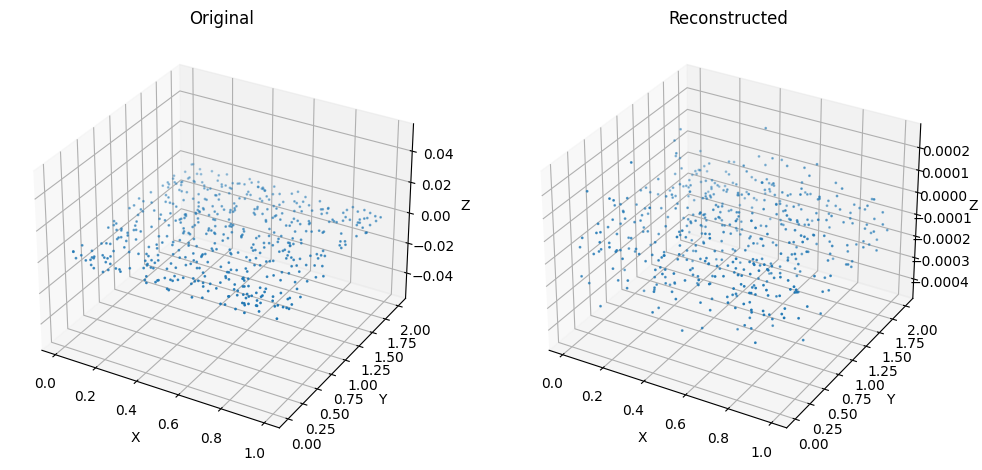

Epoch 401, Avg Loss: 1.2983698979951441e-05
Epoch 402, Avg Loss: 3.748222714724155e-06
Epoch 403, Avg Loss: 1.3949344368787328e-05
Epoch 404, Avg Loss: 6.460734311986016e-06
Epoch 405, Avg Loss: 4.241907239096084e-06
Epoch 406, Avg Loss: 1.4477314380201278e-05
Epoch 407, Avg Loss: 5.563113139335958e-06
Epoch 408, Avg Loss: 2.0755089053636766e-05
Epoch 409, Avg Loss: 1.3911848175969984e-05
Epoch 410, Avg Loss: 2.05340449307793e-05
Epoch 411, Avg Loss: 1.5391244005513727e-05
Epoch 412, Avg Loss: 1.3953917762895193e-05
Epoch 413, Avg Loss: 1.6788334202525828e-05
Epoch 414, Avg Loss: 2.804807119597778e-05
Epoch 415, Avg Loss: 1.2806202297118338e-05
Epoch 416, Avg Loss: 1.611852955344754e-05
Epoch 417, Avg Loss: 9.08148012968013e-06
Epoch 418, Avg Loss: 7.61203750698769e-06
Epoch 419, Avg Loss: 9.694643722468754e-06
Epoch 420, Avg Loss: 4.123000280742417e-06


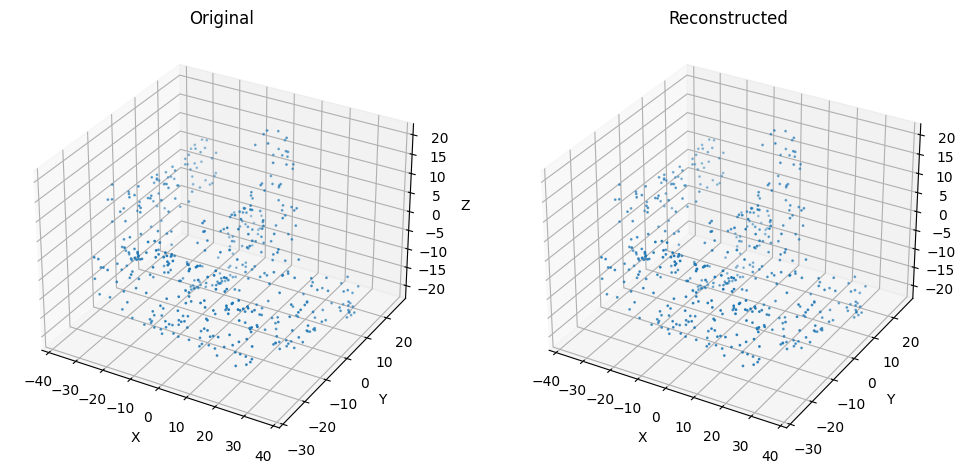

Epoch 421, Avg Loss: 2.629743994475575e-05
Epoch 422, Avg Loss: 1.37988446719343e-05
Epoch 423, Avg Loss: 5.963307254811904e-06
Epoch 424, Avg Loss: 2.0295428555527906e-05
Epoch 425, Avg Loss: 1.2298617472576249e-05
Epoch 426, Avg Loss: 6.735009719704976e-06
Epoch 427, Avg Loss: 1.277174624192412e-05
Epoch 428, Avg Loss: 2.233154486930289e-05
Epoch 429, Avg Loss: 1.1195801259115493e-05
Epoch 430, Avg Loss: 5.7674206345836865e-05
Epoch 431, Avg Loss: 3.136089556695273e-05
Epoch 432, Avg Loss: 5.435840254601013e-05
Epoch 433, Avg Loss: 4.915686539182692e-05
Epoch 434, Avg Loss: 1.249786142428396e-05
Epoch 435, Avg Loss: 2.971494238105758e-05
Epoch 436, Avg Loss: 3.893770538828297e-05
Epoch 437, Avg Loss: 8.644280872734575e-06
Epoch 438, Avg Loss: 2.024240075115813e-05
Epoch 439, Avg Loss: 2.4534519676914595e-05
Epoch 440, Avg Loss: 1.4261623694740896e-05


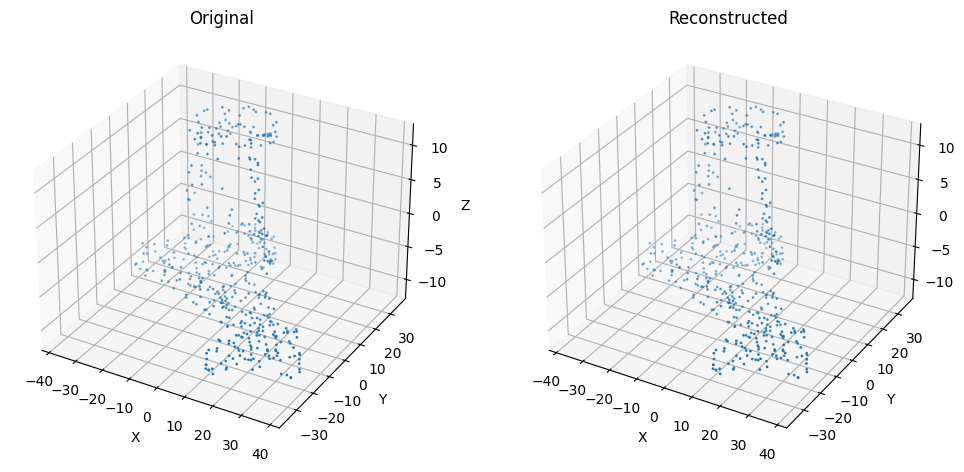

Epoch 441, Avg Loss: 2.506305175605424e-05
Epoch 442, Avg Loss: 1.3446006884502518e-05
Epoch 443, Avg Loss: 3.380219027349085e-06
Epoch 444, Avg Loss: 5.8003908520731784e-05
Epoch 445, Avg Loss: 2.4015581705801498e-05
Epoch 446, Avg Loss: 3.779799347588172e-05
Epoch 447, Avg Loss: 1.5203264714121664e-05
Epoch 448, Avg Loss: 1.646902577097838e-05
Epoch 449, Avg Loss: 6.162080145107514e-06
Epoch 450, Avg Loss: 6.373069481924176e-06
Epoch 451, Avg Loss: 4.548271590465447e-06
Epoch 452, Avg Loss: 4.20152764490922e-06
Epoch 453, Avg Loss: 3.135405298356394e-06
Epoch 454, Avg Loss: 3.7241632829439673e-06
Epoch 455, Avg Loss: 1.661349074311147e-06
Epoch 456, Avg Loss: 1.8658065528143197e-06
Epoch 457, Avg Loss: 1.9927509621690356e-06
Epoch 458, Avg Loss: 9.000017939797544e-07
Epoch 459, Avg Loss: 1.2807313585957065e-06
Epoch 460, Avg Loss: 6.938831328776965e-07


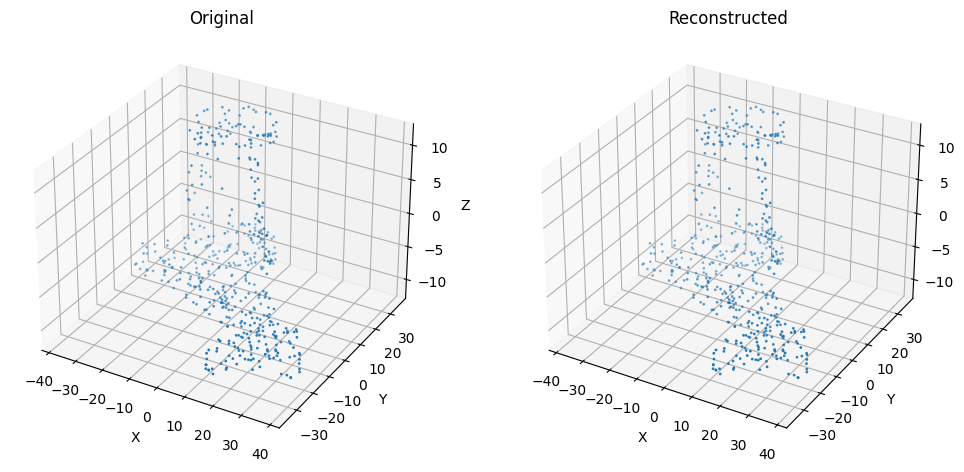

Epoch 461, Avg Loss: 9.816488197126698e-07
Epoch 462, Avg Loss: 6.531007178030753e-07
Epoch 463, Avg Loss: 7.326514719352417e-07
Epoch 464, Avg Loss: 1.1452423886263812e-06
Epoch 465, Avg Loss: 1.0983513713351083e-06
Epoch 466, Avg Loss: 1.20528738041988e-06
Epoch 467, Avg Loss: 1.3885684021867444e-06
Epoch 468, Avg Loss: 7.318461427985312e-07
Epoch 469, Avg Loss: 6.881136300762591e-07
Epoch 470, Avg Loss: 1.2709890881978936e-06
Epoch 471, Avg Loss: 9.222148283546024e-07
Epoch 472, Avg Loss: 1.644750663369147e-06
Epoch 473, Avg Loss: 1.485426006790173e-06
Epoch 474, Avg Loss: 7.567808305945315e-07
Epoch 475, Avg Loss: 1.249436233289695e-06
Epoch 476, Avg Loss: 3.0251355553900794e-07
Epoch 477, Avg Loss: 3.8066309950105883e-06
Epoch 478, Avg Loss: 2.3578855869269924e-06
Epoch 479, Avg Loss: 1.9882055634449594e-06
Epoch 480, Avg Loss: 5.217315901973052e-06


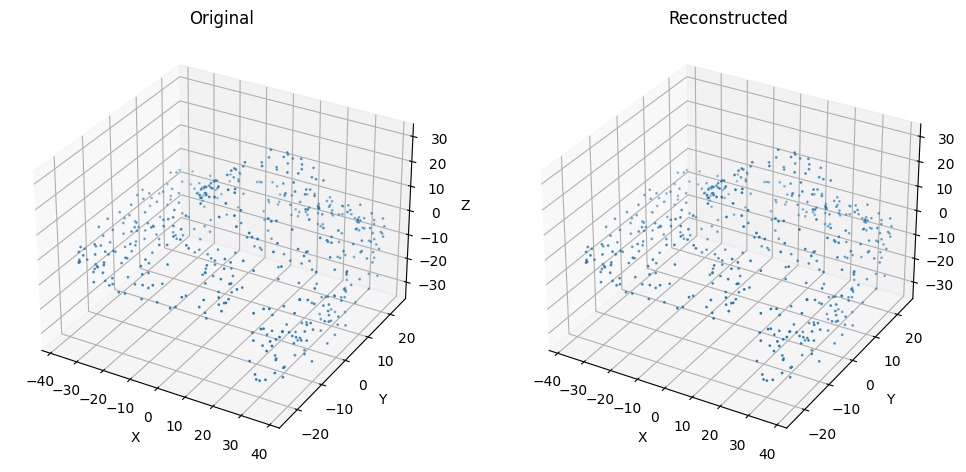

Epoch 481, Avg Loss: 2.649108864716254e-06
Epoch 482, Avg Loss: 4.602610109335122e-06
Epoch 483, Avg Loss: 1.7450723438135658e-06
Epoch 484, Avg Loss: 4.990665142183086e-06
Epoch 485, Avg Loss: 4.784836050930608e-06
Epoch 486, Avg Loss: 9.914358580923969e-06
Epoch 487, Avg Loss: 2.29534365037883e-05
Epoch 488, Avg Loss: 1.0765065477850536e-05
Epoch 489, Avg Loss: 2.190768585326926e-05
Epoch 490, Avg Loss: 1.5532030981072847e-05
Epoch 491, Avg Loss: 9.313534671188487e-06
Epoch 492, Avg Loss: 2.14215318384466e-05
Epoch 493, Avg Loss: 2.4523996051091974e-05
Epoch 494, Avg Loss: 1.480807429743436e-05
Epoch 495, Avg Loss: 5.192350416412713e-05
Epoch 496, Avg Loss: 3.524972322329253e-05
Epoch 497, Avg Loss: 3.869180924690833e-05
Epoch 498, Avg Loss: 5.128253178554587e-05
Epoch 499, Avg Loss: 1.1174898342384646e-05
Epoch 500, Avg Loss: 0.00010253470827592537


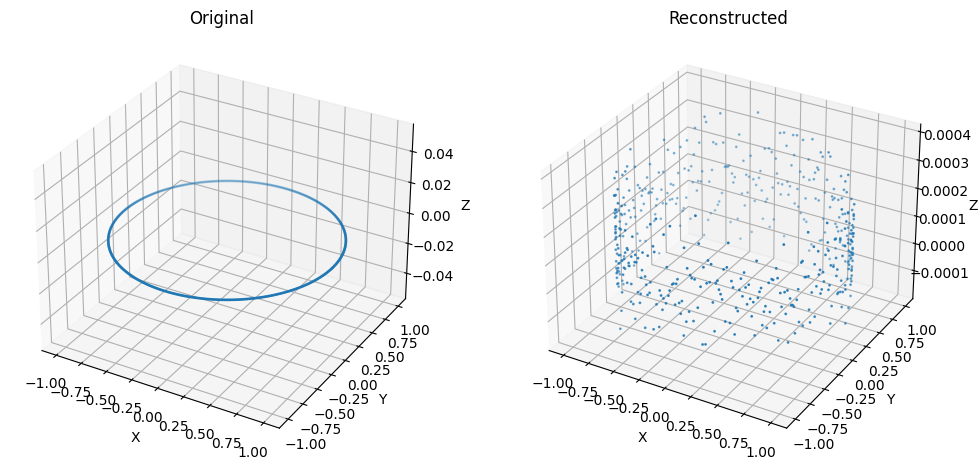

Input shape to the model: torch.Size([1, 500, 3])


In [95]:
selected_point_cloud = point_clouds[5]  # Correctly selecting the point cloud
autoencoder = train_and_visualize(point_clouds, epochs=500, lr=0.001, visualize_every_n_epochs=20, batch_size=4)

# Reshape selected_point_cloud to [1, 3, num_points] for the model
if selected_point_cloud.dim() == 2 and selected_point_cloud.size(1) == 3:
    model_input = selected_point_cloud.transpose(0, 1).unsqueeze(0)
else:
    print("Unexpected point cloud shape. Ensure it's [num_points, 3].")


encoded_representation = encode_point_cloud(autoencoder, model_input)


In [96]:
print("encoded representation shape: ", encoded_representation.shape, "\n")
print(encoded_representation)

encoded representation shape:  (128,) 

[ 4.8940396  10.404957    1.3320253   1.0633849   4.269065    0.38258034
  0.4756438  10.292689    0.29775497 12.588296    6.128027    9.339115
  7.8469033   1.2001593   4.6515474   7.3185205  -0.8759136  10.20367
 -0.28402478  3.4319165   3.8698928  22.441252   16.231367   12.928161
  2.1388333  -0.4234433   8.285605   10.963699   -0.20290846  1.5059677
  0.8152927   2.964712    9.346912   -1.3583522   5.366747    0.59530133
  8.397797    6.142409   -1.5555886   7.540895    1.3593078   1.5940074
 -0.09510994  2.7041423  10.265513   17.784885    6.7729197  14.936093
 -0.0356819   7.6675615   3.810974   -0.6821063   8.140091    3.8526871
  9.2531      0.46195167 -0.52172315  9.695561   13.526013    7.6045265
 -0.90534997  2.5681434   0.5198015   3.8224976   2.1158051  11.81058
  4.864376    6.4321275   5.6257296  10.561317    9.01033     4.961294
 10.684457   -0.25804397 -0.7592244   7.731693   13.841716    2.2765274
  9.713979    1.1091546  12.43

Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])
Input shape to the model: torch.Size([1, 500, 3])


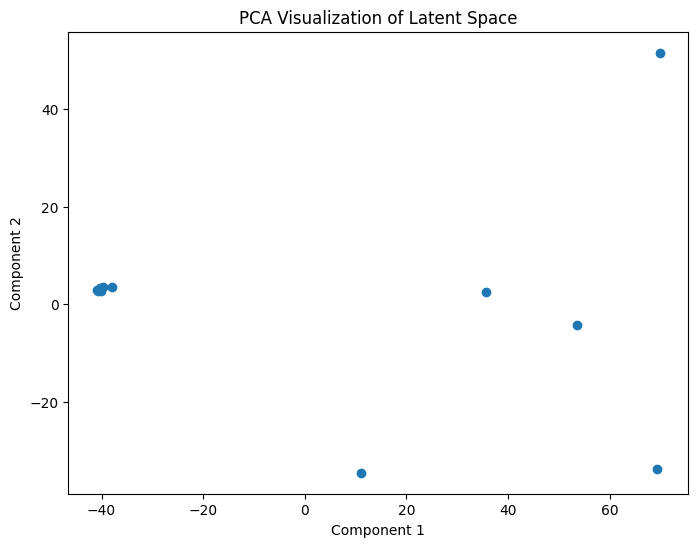

In [97]:
from sklearn.manifold import TSNE

def visualize_latent_space(latent_representations, method='pca'):
    """
    Visualize the latent space using PCA or t-SNE.

    Args:
    - latent_representations: A 2D numpy array of shape (n_samples, n_features)
    - method: 'pca' or 'tsne' indicating which method to use for visualization
    """
    if method == 'pca':
        pca = PCA(n_components=2)
        result = pca.fit_transform(latent_representations)
    elif method == 'tsne':
        tsne = TSNE(n_components=2, perplexity=30)
        result = tsne.fit_transform(latent_representations)
    else:
        raise ValueError("Unsupported method. Choose 'pca' or 'tsne'.")

    plt.figure(figsize=(8, 6))
    plt.scatter(result[:, 0], result[:, 1])
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.title(f'{method.upper()} Visualization of Latent Space')
    plt.show()

# visualize_latent_space(all_encoded_representations, method='pca')
all_encoded_representations = []
for point_cloud in point_clouds:  # Assuming 'point_clouds' is your dataset
    # Ensure point_cloud is properly shaped as [1, num_points, 3] before this step
    encoded = encode_point_cloud(autoencoder, point_cloud.transpose(0, 1).unsqueeze(0))
    all_encoded_representations.append(encoded)

all_encoded_representations = np.array(all_encoded_representations)
visualize_latent_space(all_encoded_representations, method='pca')


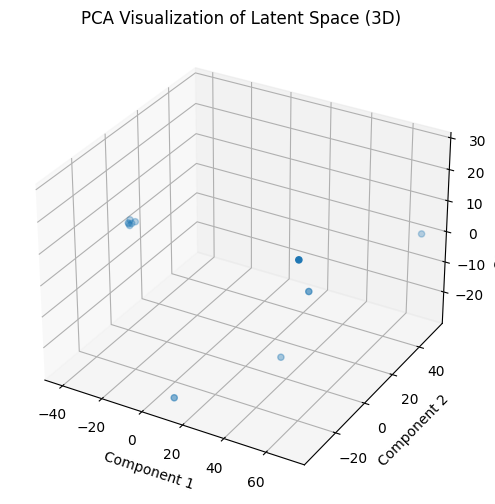

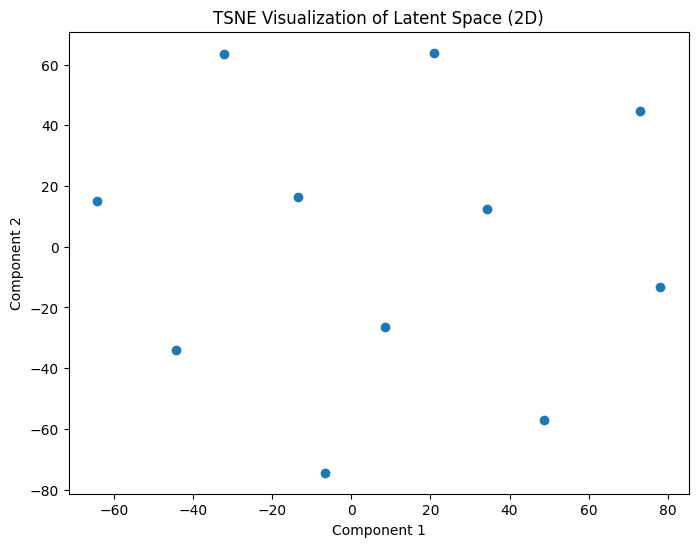

In [98]:
def visualize_latent_space(latent_representations, method='pca', n_components=3):
    n_samples = latent_representations.shape[0]
    perplexity = min(30, n_samples - 1)  # Ensure perplexity is less than n_samples

    if method == 'pca':
        pca = PCA(n_components=n_components)
        result = pca.fit_transform(latent_representations)
    elif method == 'tsne':
        tsne = TSNE(n_components=n_components, perplexity=perplexity)
        result = tsne.fit_transform(latent_representations)
    else:
        raise ValueError("Unsupported method. Choose 'pca' or 'tsne'.")

    plt.figure(figsize=(8, 6))
    if n_components == 3:
        ax = plt.axes(projection='3d')
        ax.scatter3D(result[:, 0], result[:, 1], result[:, 2])
        ax.set_xlabel('Component 1')
        ax.set_ylabel('Component 2')
        ax.set_zlabel('Component 3')
    else:
        plt.scatter(result[:, 0], result[:, 1])
        plt.xlabel('Component 1')
        plt.ylabel('Component 2')
    plt.title(f'{method.upper()} Visualization of Latent Space ({n_components}D)')
    plt.show()


visualize_latent_space(all_encoded_representations, method='pca', n_components=3)
visualize_latent_space(all_encoded_representations, method='tsne', n_components=2)
